# Handwritten Tabular Form — **column-wise** processing

Same scanned forms as `Handwritten_Table_Preprocessing.ipynb`, but the page is cut **by column, not by cell**.
Each column of the printed grid becomes ONE tall image holding every entry written in that column; that image is
read by **two independent OCR engines, GOT-OCR-2.0 and TrOCR**, and the readings are filed under the column's
header name, per engine, so the two can be compared cell by cell.

| # | Stage | What it does |
|---|-------|--------------|
| 0–9 | Setup → grid | unchanged from the cell-wise notebook: render PDFs / load images (jpg, png, tif …) at 300 DPI, denoise / flatten / deskew, find the table, find the rows and columns, name them from the template |
| 10 | **Column crops** | one padded crop per column, spanning the whole data area |
| 11 | Line removal | erase the printed grid from each column strip, keeping the strokes that cross it |
| 12 | Debug views | the column strips, before and after |
| 13 | OCR models | loads `GOT-OCR-2.0` **and** `TrOCR` |
| 14 | **Column reader** | reads a strip with either engine, returns one entry per printed row |
| 15 | Run + JSON | `columns_ocr_results_GOT.json` and `columns_ocr_results_TrOcr.json`, keyed by column name |
| 16 | Table CSV | the entries put back side by side, one CSV per PDF, written under `structured_GOT/` and `structured_TrOcr/` |
| 16b | **Model comparison report** | `model_comparison_report/`: per-engine fill rate / confidence / speed, cell-by-cell agreement between GOT and TrOCR, charts, and a narrative `report.md` |
| 17 | Save + download | zip the output folder (both structured folders + the report) |

**How a strip is read.** `COLUMN_SPLIT = "rows"` (the default) cuts the strip at the printed row lines and reads
each entry, so every column returns the same number of entries and the columns stay aligned — which is what lets
Stage 16 put the table back together, and what lets Stage 16b line the two engines' entries up row for row.
`COLUMN_SPLIT = "whole"` hands the entire strip to a model in a single call; that is one call per column instead
of one per entry, but both models return only ONE line for a multi-line image, so most of the column is lost, and
Stage 16/16b (which need a row-aligned table) are skipped. It is kept for comparison, not for production.

**Two engines, one set of crops.** Stage 10–12 (finding the grid, cropping each column, erasing the printed
lines) runs exactly once per page; Stage 14–15 then hand the *same* clean crops to GOT-OCR-2.0 and to TrOCR in
turn, so any difference in their output is the model, not the image. `structured_GOT/<pdf>.csv` and
`structured_TrOcr/<pdf>.csv` hold each engine's own table; `model_comparison_report/` holds the scorecard.

**Wrapped entries.** This notebook has no record grouping: an entry carried onto a second printed row appears as
two consecutive entries in that column. The cell-wise notebook groups those rows into one record.


In [1]:
# ============================================================================
# STAGE 0 — SETUP
# Installs only what is missing (Colab already ships torch, transformers, OpenCV,
# pandas and matplotlib; PyMuPDF is the one usually needed).
#
# NOTE ON TOKENIZERS: GOT-OCR-2.0's Qwen-based tokenizer and TrOCR's RoBERTa-based one can both need
# `sentencepiece` / `tiktoken` installed to build their FAST tokenizer, and transformers only checks for these
# once, at import time. If this cell has to install either of them for the first time, RESTART THE RUNTIME /
# KERNEL and re-run from the top - otherwise Stage 13 fails with:
#     "Couldn't instantiate the backend tokenizer ... You need to have sentencepiece or tiktoken installed"
# even though the package is now on disk, because transformers already cached the "not available" answer.
# ============================================================================
import importlib.util, importlib.metadata, subprocess, sys
from packaging.version import Version

def ensure(pip_name, module=None):
    """pip-install `pip_name` if `module` cannot be imported. Returns True if it had to be installed."""
    if importlib.util.find_spec(module or pip_name) is None:
        print(f"installing {pip_name} ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pip_name])
        return True
    return False

_newly_installed = []

# transformers is pinned (not just ensure()d) to a range that supports GOT-OCR-2.0 (added 4.49) but stays
# below 5.0, where a TokenizersBackend regression makes fast-tokenizer loading wrongly demand
# sentencepiece/tiktoken even for byte-level BPE tokenizers like TrOCR's - breaking Stage 13 with
# "Couldn't instantiate the backend tokenizer ... sentencepiece or tiktoken" even when both are installed.
_TRANSFORMERS_MIN, _TRANSFORMERS_MAX = Version("4.49"), Version("5.0")
try:
    _cur_transformers = Version(importlib.metadata.version("transformers"))
except importlib.metadata.PackageNotFoundError:
    _cur_transformers = None
if _cur_transformers is None or not (_TRANSFORMERS_MIN <= _cur_transformers < _TRANSFORMERS_MAX):
    print(f"pinning transformers to >=4.49,<5.0 (was {_cur_transformers}) ...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "transformers>=4.49,<5.0"])
    _newly_installed.append("transformers")

for pip_name, module in [("pymupdf", "pymupdf"), ("opencv-python-headless", "cv2"),
                         ("torch", "torch"),
                         ("pandas", "pandas"), ("matplotlib", "matplotlib"), ("pillow", "PIL"),
                         ("sentencepiece", "sentencepiece"), ("tiktoken", "tiktoken"), ("tabulate", "tabulate")]:
    if ensure(pip_name, module):
        _newly_installed.append(pip_name)
print("setup OK")
if _newly_installed:
    print(f"\nJust installed: {', '.join(_newly_installed)}")
    print("If any of these is sentencepiece/tiktoken, RESTART THE RUNTIME now and re-run from this cell -")
    print("transformers caches tokenizer-backend availability at import time, so a same-session install of")
    print("either package is invisible to it until the process restarts.")


pinning transformers to >=4.49,<5.0 (was 5.16.1) ...
installing pymupdf ...
setup OK

Just installed: transformers, pymupdf
If any of these is sentencepiece/tiktoken, RESTART THE RUNTIME now and re-run from this cell -
transformers caches tokenizer-backend availability at import time, so a same-session install of
either package is invisible to it until the process restarts.


In [2]:
# ============================================================================
# STAGE 1 — CONFIG + SMALL UTILITIES
# Everything you may want to tune lives here.
# ============================================================================
import os, re, json, glob, math, time, shutil, warnings
from dataclasses import dataclass, field
from datetime import datetime
from typing import Optional

import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

warnings.filterwarnings("ignore")

IN_COLAB = "google.colab" in sys.modules

# ---- permanent storage (Colab) -------------------------------------------------
# Colab's own disk (/content) is wiped when the runtime ends, so on Colab the uploads AND every
# output file live in this Google Drive folder instead - they are still there after a restart.
DRIVE_ROOT = "/content/drive/MyDrive/MeenakshiPublic"

def mount_drive():
    """Mount Google Drive once (Colab only). Safe to call again - it is a no-op when already mounted."""
    if not IN_COLAB:
        return
    from google.colab import drive                      # only available inside Colab
    if not os.path.isdir("/content/drive/MyDrive"):
        drive.mount("/content/drive")

mount_drive()                                           # needed before the makedirs further down

# ---- where the PDFs / images come from -------------------------------------------------
INPUT_MODE     = "drive" if IN_COLAB else "local"      # "drive" | "upload" | "local"
DRIVE_PDF_DIR  = f"{DRIVE_ROOT}/Datasetpdf"             # used when INPUT_MODE == "drive"
LOCAL_PDF_DIR  = "Dataset"                              # used when INPUT_MODE == "local"
UPLOAD_DIR     = f"{DRIVE_ROOT}/uploads" if IN_COLAB else "uploads"      # used when INPUT_MODE == "upload"
ONLY_FILES     = []                                     # e.g. ["WELD"] to process only matching file names
AUTO_TEMPLATE  = True                                   # when the FILE NAME matches no template, work the form out
                                                        # from the page itself (Stage 7b): the number of columns in
                                                        # the printed grid, and the heading printed above the table
OUTPUT_DIR     = f"{DRIVE_ROOT}/ocr_output_v4_column" if IN_COLAB else "ocr_output"   # crops / debug / JSON / CSV
COPY_OUTPUT_TO_DRIVE = None                             # not needed on Colab any more: OUTPUT_DIR is already on Drive

# ---- rendering / pre-processing ----------------------------------------------
GOT_MODEL_ID   = "stepfun-ai/GOT-OCR-2.0-hf"        # OCR engine 1 (Stage 7b may need it before Stage 14 does)
TROCR_MODEL_ID = "microsoft/trocr-base-handwritten"  # OCR engine 2 - read alongside GOT-OCR-2.0 for comparison (Stage 13)

PDF_BACKEND    = "pymupdf"      # "pymupdf" | "pdf2image" (needs poppler; installed automatically on Colab)
DPI            = 300            # requirement: 300 DPI page images
IMAGE_EXTS     = (".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp", ".webp")   # image files are read as well as PDFs
INPUT_EXTS     = (".pdf",) + IMAGE_EXTS
IMAGE_PAGE_SHORT_IN = 8.27      # an image has no physical size: unless it carries a believable DPI tag (scanner
                                # output), its SHORT side is taken to be A4's 8.27 in and the image is scaled to
                                # 8.27 * DPI px on that side, so every px setting below stays valid
MIN_SOURCE_DPI = 200            # warn when the source (scan, phone photo, image) holds less detail than this -
                                # upscaling to DPI adds pixels, not detail
DENOISE_H      = 7              # fastNlMeans strength (higher = smoother, may blur thin pen strokes)
CLAHE_CLIP     = 2.0            # contrast enhancement strength
MAX_DESKEW_DEG = 5.0            # ignore |skew| larger than this (would mean a bad estimate)

# ---- table / grid detection ---------------------------------------------------
LINE_KERNEL_IN = 0.40           # min length (inches) of a printed line for the morphological line masks
ROW_COVERAGE   = 0.50           # a y-position is a row line if it is inked over >= 50% of the table width
COL_COVERAGE   = 0.50           # (starting value; the detector sweeps it down until the column count matches)

# ---- crop geometry  (IMPORTANT R&D REQUIREMENT) --------------------------------
PADDING        = 10             # px added left/right of every column crop so strokes crossing the grid are not cut
                                # (this is the MINIMUM; see CROP_MAX_OVERFLOW below)
CROP_MAX_OVERFLOW = 40          # px a crop may grow beyond the printed cell to catch handwriting that overflows the
                                # column. The QTY columns are only ~67 px wide at 300 DPI, so a 4-digit number
                                # written in one routinely spills over the printed line and used to be cut in half.
CROP_GUTTER_PX    = 6           # px of white that ends the overflow — the gap that separates this entry from the
                                # neighbouring column's handwriting
CROP_INK_EPS      = 1           # ink pixels in a column below this counts as white
CROP_EDGE_MARGIN  = 3           # px kept beyond the last inked column
V_PADDING      = 10             # px added above/below (handwriting also crosses horizontal lines; lower it if
                                # the neighbouring record bleeds into tight rows)
V_PADDING_TOP   = 2             # px above the FIRST data row when header text sits right above it (the minimum)
V_PADDING_FIRST = 14            # px the FIRST data row may grow upwards when there is room. Handwriting on the
                                # first line often rises above the header/body boundary and used to be chopped by
                                # it; the crop now stops just below any header text found in the gap, so the
                                # printed column names are still not pulled in.
LAST_COL_MODE  = "page"         # last column right edge:
                                #   "page"  -> extend all the way to the right edge of the page image (default)
                                #   "table" -> table_right + PADDING (the strict formula)

# ---- line removal / ink tests -------------------------------------------------
LINE_REMOVAL_MODE = "guided"    # "guided": morphological lines, but only near the known grid positions
                                # "morph" : morphological lines anywhere in the crop (also erases handwritten underlines)
LINE_KERNEL_FRAC  = 0.55        # a run must span this fraction of the crop to count as a printed grid line
LINE_RUN_CAP_PX   = 60          # ... but never has to be longer than this, so the short line stub in the very wide
                                # last column is still recognised as a line
LINE_GUIDE_TOL    = 8           # px: how far from its expected position a printed line is searched for in a crop
LINE_HALF_PX      = 5           # px: half-thickness of the band around each printed line that MAY be erased
LINE_CROSS_PX     = 8           # px searched above/below (and left/right of) a printed line for the CONTINUATION
                                # of a pen stroke. Only a real crossing - ink on BOTH sides - is protected from
                                # the erase. Text merely resting ON a line has ink on one side only, so the line
                                # under it is still removed. Raise if letters break, lower if lines survive.
LINE_INPAINT_RAD  = 2           # px: cv2.inpaint radius used to fill the erased line pixels
INK_GRAY_THRESH   = 150         # gray level below which a pixel counts as pen ink (after flatten + CLAHE)
MIN_INK_PIXELS    = 120         # fewer ink pixels than this in a cell -> treated as empty
MIN_ANCHOR_INK    = 150         # ink needed in the anchor column to start a new record

# ---- debugging ----------------------------------------------------------------
SHOW_DEBUG     = True           # display intermediate images inline
SAVE_DEBUG     = True           # also save them to OUTPUT_DIR/debug/<page>/
VIEW_PAGES     = None           # None = show all pages; or e.g. ["SUPPLIER REJECTION REPORT_p1"]

os.makedirs(OUTPUT_DIR, exist_ok=True)


# ---- utilities used by several stages ------------------------------------------
def safe_name(s):
    return re.sub(r"[^A-Za-z0-9]+", "_", str(s)).strip("_")

def to_bgr(img):
    return cv2.cvtColor(img, cv2.COLOR_GRAY2BGR) if img.ndim == 2 else img

def show(img, title="", figsize=(9, 12), max_side=None):
    """Display a BGR / gray image inline (nothing happens if SHOW_DEBUG is False)."""
    if not SHOW_DEBUG:
        return
    plt.figure(figsize=figsize)
    if img.ndim == 2:
        plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=11)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def save_debug(page, name, img):
    """Write a debug image to OUTPUT_DIR/debug/<page uid>/<name>."""
    if not SAVE_DEBUG:
        return None
    d = os.path.join(OUTPUT_DIR, "debug", page.uid)
    os.makedirs(os.path.dirname(os.path.join(d, name)), exist_ok=True)
    path = os.path.join(d, name)
    cv2.imwrite(path, img)
    return path

def group_peaks(profile, thr, min_gap=6):
    """Centres (intensity-weighted) of runs where profile >= thr; runs closer than min_gap px merge."""
    idx = np.flatnonzero(profile >= thr)
    if idx.size == 0:
        return []
    groups = np.split(idx, np.flatnonzero(np.diff(idx) > min_gap) + 1)
    return [float((profile[g] * g).sum() / profile[g].sum()) for g in groups]

def viewed(page):
    return VIEW_PAGES is None or page.uid in VIEW_PAGES

def load_pretrained(loader, model_id, **kw):
    """`loader.from_pretrained(model_id, **kw)`, turned into an actionable message on the classic
    "Couldn't instantiate the backend tokenizer ... sentencepiece or tiktoken" failure - which almost always
    means the package installed fine (Stage 0) but the CURRENT process never saw it. transformers checks once,
    at import time, so the fix is a runtime/kernel restart, not another pip install."""
    try:
        return loader.from_pretrained(model_id, **kw)
    except ValueError as e:
        if "sentencepiece or tiktoken" in str(e):
            raise RuntimeError(
                f"Could not load the tokenizer for {model_id}: sentencepiece/tiktoken are installed (Stage 0) "
                "but this process started before that install and never picked it up. RESTART THE RUNTIME / "
                "KERNEL, then re-run the notebook from the top - no code change needed.") from e
        raise

print("Config loaded. Input mode:", INPUT_MODE, "| DPI:", DPI, "| padding:", PADDING, "| last column:", LAST_COL_MODE)
print("Uploads ->", UPLOAD_DIR)
print("Output  ->", OUTPUT_DIR, "(permanent Drive storage)" if IN_COLAB else "(local folder)")


Mounted at /content/drive
Config loaded. Input mode: drive | DPI: 300 | padding: 10 | last column: page
Uploads -> /content/drive/MyDrive/MeenakshiPublic/uploads
Output  -> /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column (permanent Drive storage)


In [3]:
# ============================================================================
# STAGE 2 — FORM TEMPLATES  (configurable column / header names per form)
#
#   match               : upper-case fragments looked for in the PDF file name (first template that matches wins)
#   columns             : header names, LEFT -> RIGHT.  The OCR result is stored under these names.
#   anchor              : column that is filled on the FIRST printed row of every record
#                         (DATE / S.NO).  A new record starts wherever the anchor cell has ink.  None = one record per inked row.
#   max_rows_per_record : how many printed grid rows one handwritten record may span (wrapped text)
#
# To support a new form, add an entry here.  To force a template for a file, use TEMPLATE_BY_FILE.
# ============================================================================
TEMPLATES = {
    "supplier_lot_rejection_summary": dict(
        match=["LOT REJECTION"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "REW QTY", "REJ QTY", "OK QTY",
                 "PROBLEM DESCRIPTION", "ACTION", "RETURN STATUS", "CAPA STATUS", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
    "weld_shop_rejection_report": dict(
        match=["WELD SHOP", "WELDSHOP"],
        columns=["S.NO", "ITEM CODE", "MATERIAL PARTICULARS", "UNIT", "REJECTION QTY", "VENDOR NAME", "REASON / REMARKS"],
        anchor="S.NO", max_rows_per_record=2),
    "supplier_rework_report": dict(
        match=["REWORK"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "REWORK QTY", "OK QTY", "PROBLEM DESCRIPTION", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
    "supplier_segregation_report": dict(
        match=["SEGREGATION"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "SEGREGATION QTY", "OK QTY", "PROBLEM DESCRIPTION", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
    "supplier_rejection_report": dict(
        match=["SUPPLIER REJECTION"],
        columns=["DATE", "PART NAME", "SUPPLIER NAME", "LOT QTY", "REJECTION QTY", "OK QTY", "PROBLEM DESCRIPTION", "REMARKS"],
        anchor="DATE", max_rows_per_record=2),
}

# Force a template for a specific file (file name -> template key), e.g. scans with generic names:
TEMPLATE_BY_FILE = {
    # "scan_0042.pdf": "supplier_rework_report",
}

def pick_template(pdf_path):
    name = os.path.basename(pdf_path)
    if name in TEMPLATE_BY_FILE:
        return TEMPLATE_BY_FILE[name]
    norm = re.sub(r"[_\-\.]+", " ", os.path.splitext(name)[0]).upper()
    for key, t in TEMPLATES.items():
        if any(m in norm for m in t["match"]):
            return key
    return None

print("Templates:", {k: len(v["columns"]) for k, v in TEMPLATES.items()})


Templates: {'supplier_lot_rejection_summary': 12, 'weld_shop_rejection_report': 7, 'supplier_rework_report': 8, 'supplier_segregation_report': 8, 'supplier_rejection_report': 8}


In [4]:
# ============================================================================
# STAGE 3 — MANUAL CONFIGURATION  (use this when automatic grid detection fails)
#
# Keyed by PDF *stem* (file name without .pdf, checked first) or by template key.
# Coordinates are pixels of the ALIGNED 300-DPI page — the same numbers printed in the Stage 9 log and
# drawn on the "row/column boundaries" debug image, so you can read them off and correct them.
#
#   col_x        : N+1 x-positions (every vertical line, left border ... right border)
#                  or N x-positions (left edges only; the table's right edge is then used as the last boundary)
#   header_names : optional, overrides the template's column names for that page
#   body_top     : y of the line that separates the header row from the first data row
#   body_bottom  : y of the last data-row line (top of the signature/footer row)
#   row_y        : optional explicit list of every horizontal line in the data area
#                  (if you only give body_top/body_bottom + row_pitch, lines are generated at that pitch)
#   row_pitch    : optional uniform row height in px
#   anchor / max_rows_per_record : optional overrides of the template's record-grouping settings
#
# Example (values are illustrative — leave MANUAL_CONFIG empty unless auto-detection misbehaves):
#   "SUPPLIER LOT REJECTION SUMMARY": dict(
#       col_x=[205, 309, 529, 706, 773, 841, 909, 975, 1655, 1889, 2023, 2111, 2229],
#       body_top=354, body_bottom=2004, row_pitch=64),
# ============================================================================
MANUAL_CONFIG = {
    "HandwrittenReport": dict(
        col_x=[60, 210, 537, 1085, 1255, 1521, 1902, 2360],
        header_names=["S.NO", "ITEM CODE", "ITEM NAME", "UNIT", "REJECTION QTY", "VENDOR NAME", "REASON / REMARKS"],
        body_top=593, body_bottom=3197, row_pitch=186),
}


In [5]:
# ============================================================================
# STAGE 4 — LOAD INPUT PDFs AND IMAGES   (Google Drive folder | file upload | local folder)
# Every file whose extension is in INPUT_EXTS (Stage 1) is taken: .pdf plus jpg / png / tif / bmp / webp.
# ============================================================================
def load_pdf_paths():
    if INPUT_MODE == "drive":
        mount_drive()                                        # already mounted in Stage 1; no-op here
        folder = DRIVE_PDF_DIR
    elif INPUT_MODE == "upload":
        from google.colab import files
        mount_drive()                                        # UPLOAD_DIR is on Drive, so the PDFs are kept
        os.makedirs(UPLOAD_DIR, exist_ok=True)
        print("Select the PDF / image files to upload ...")
        for fname, data in files.upload().items():           # opens the browser file picker
            with open(os.path.join(UPLOAD_DIR, fname), "wb") as f:
                f.write(data)
        folder = UPLOAD_DIR
    else:
        folder = LOCAL_PDF_DIR
    paths = sorted({os.path.normcase(p): p for p in glob.glob(os.path.join(folder, "*")) if p.lower().endswith(INPUT_EXTS)}.values())
    if ONLY_FILES:
        paths = [p for p in paths if any(s.upper() in os.path.basename(p).upper() for s in ONLY_FILES)]
    return paths

PDF_PATHS = load_pdf_paths()
print(f"{len(PDF_PATHS)} file(s) found:")
for p in PDF_PATHS:
    key = pick_template(p)
    print(f"  {os.path.basename(p):45s} -> template: {key or 'NO MATCH (will be skipped)'}")


5 PDF(s) found:
  HandwrittenReport.pdf                         -> template: NO MATCH (will be skipped)
  SUPPLIER LOT REJECTION SUMMARY.pdf            -> template: supplier_lot_rejection_summary
  SUPPLIER REJECTION REPORT.pdf                 -> template: supplier_rejection_report
  SUPPLIER REWORK REPORT.pdf                    -> template: supplier_rework_report
  SUPPLIER SEGREGATION REPORT.pdf               -> template: supplier_segregation_report


rendered HandwrittenReport p1: 2480x3509 px @ 300 DPI  |  template: to be identified from the page (Stage 7b)
rendered SUPPLIER LOT REJECTION SUMMARY p1: 2480x3505 px @ 300 DPI  |  template: supplier_lot_rejection_summary
rendered SUPPLIER REJECTION REPORT p1: 2480x3505 px @ 300 DPI  |  template: supplier_rejection_report
rendered SUPPLIER REWORK REPORT p1: 2480x3505 px @ 300 DPI  |  template: supplier_rework_report
rendered SUPPLIER SEGREGATION REPORT p1: 2480x3505 px @ 300 DPI  |  template: supplier_segregation_report


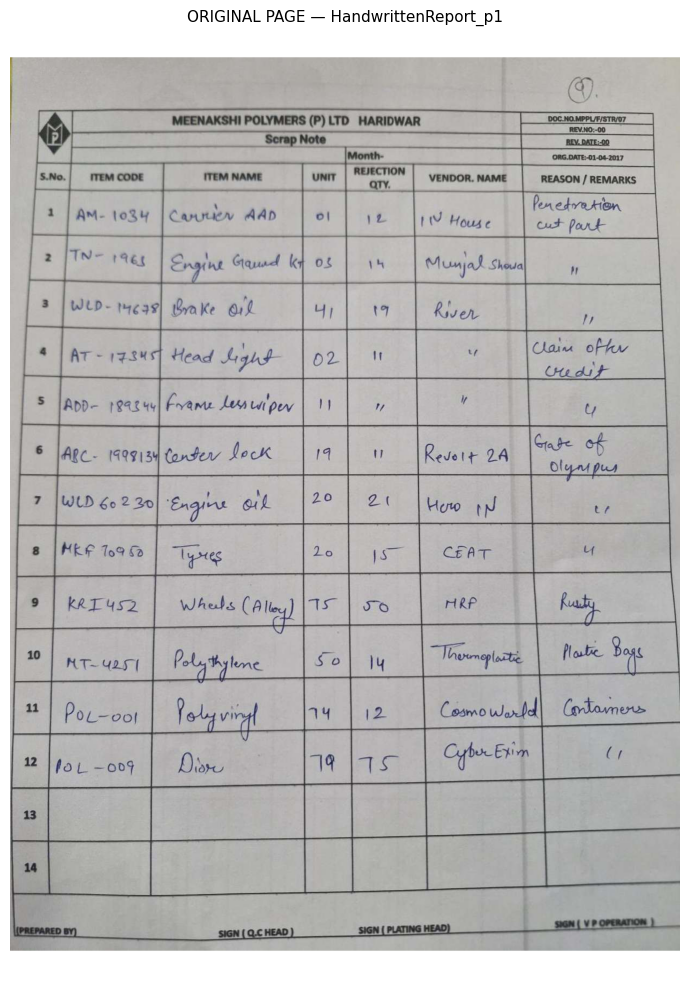

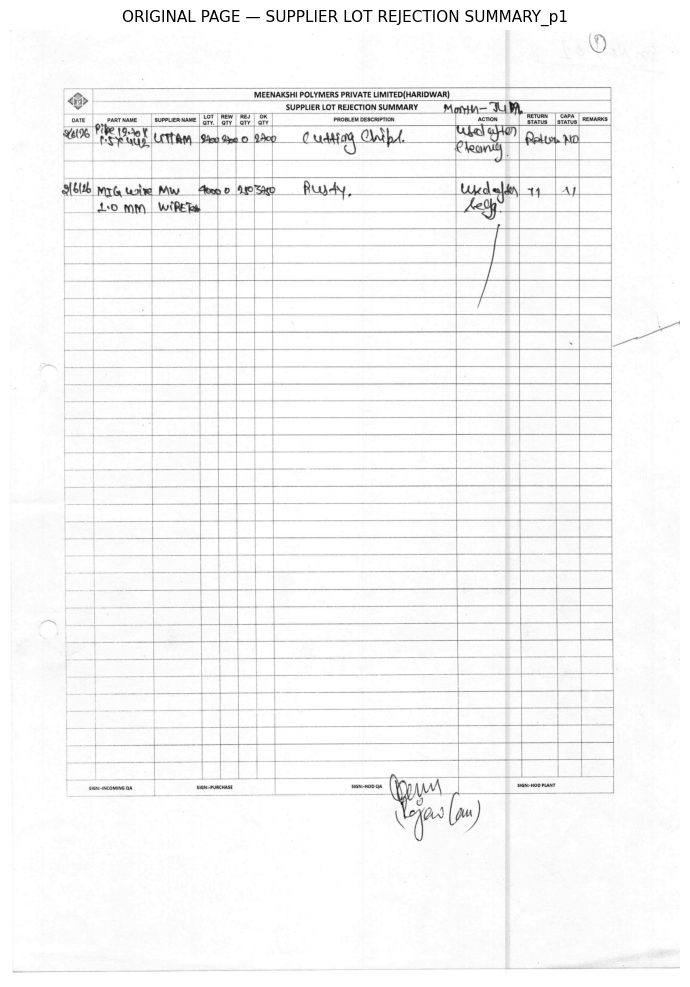

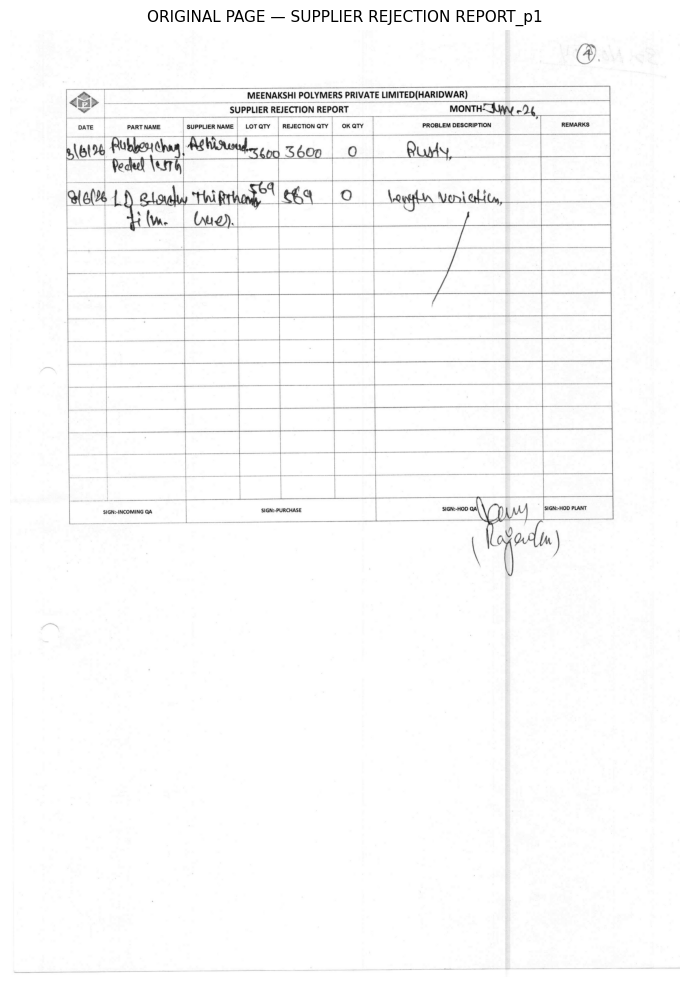

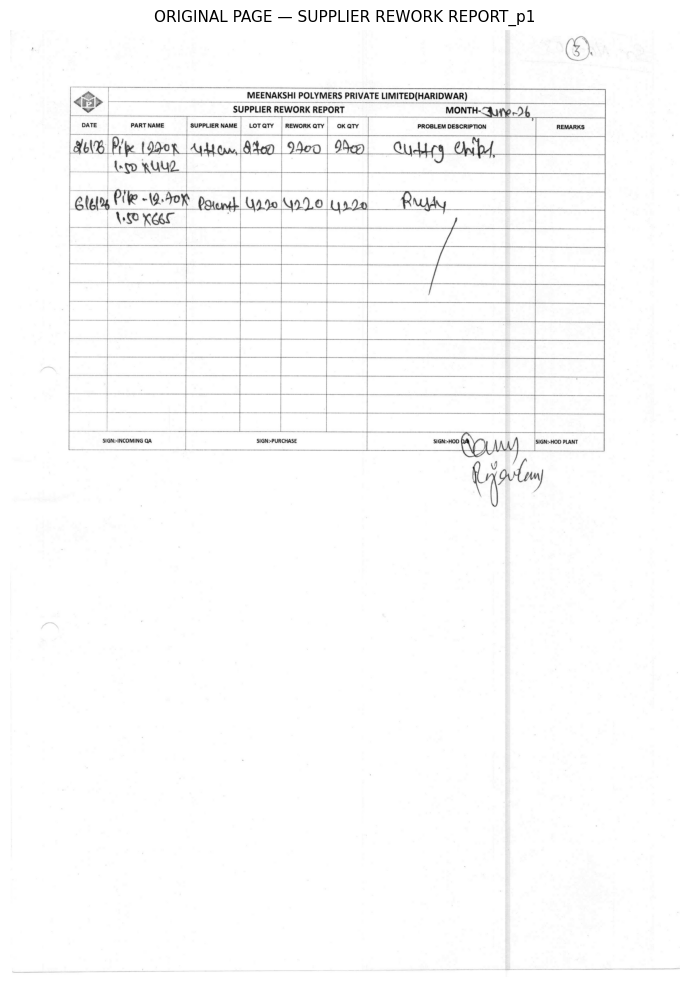

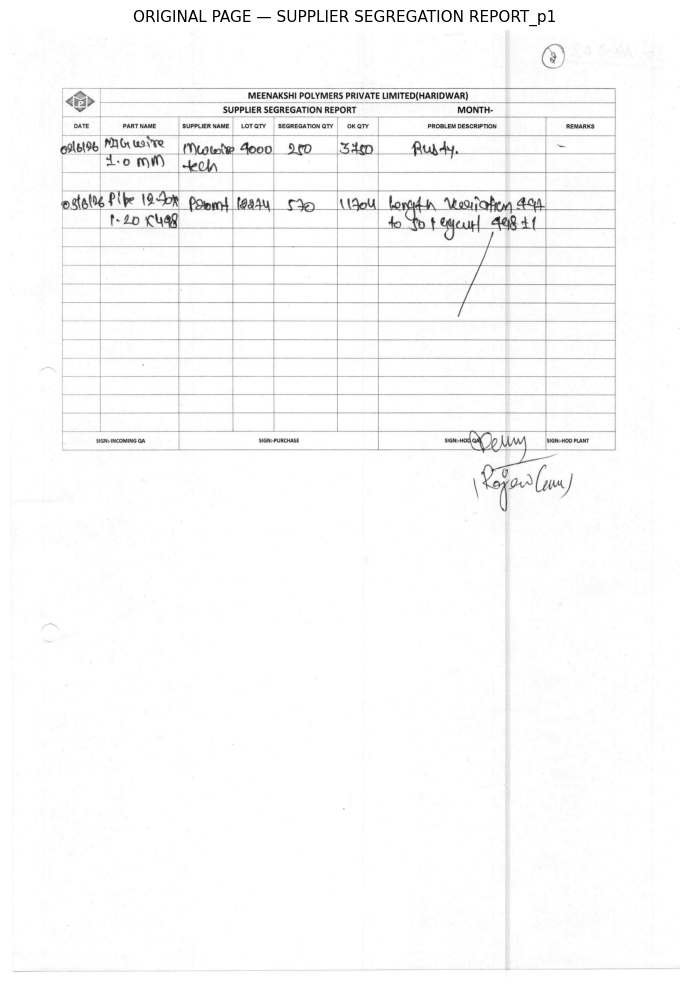

In [6]:
# ============================================================================
# STAGE 5 — PDF / IMAGE  ->  300 DPI IMAGES
# PDFs  : PyMuPDF rasterises each page at exactly DPI dots-per-inch (page size in points / 72 * DPI).
#         pdf2image (poppler) is kept as a fallback backend.
# Images: jpg / png / tif / bmp / webp. Phone rotation (EXIF orientation) is applied, every frame of a multi-page
#         TIFF becomes a page, and the image is scaled to DPI: by its own DPI tag when that is believable (150-1200,
#         i.e. scanner output), otherwise by taking its short side as A4's 8.27 in (IMAGE_PAGE_SHORT_IN).
# Either way the detail actually present in the source is estimated, and a page below MIN_SOURCE_DPI is flagged -
# a 150 DPI phone photo rendered at 300 DPI is still a 150 DPI photo.
# ============================================================================
try:
    import pymupdf
except ImportError:                       # older PyMuPDF releases expose the module as "fitz"
    import fitz as pymupdf


@dataclass
class Page:
    """Everything we learn about one page (of a PDF or an image file), filled in stage by stage."""
    pdf: str                              # source file name (PDF or image)
    page_no: int                          # 1-based page number
    uid: str                              # unique id used for debug folders, e.g. "WELD SHOP REJECTION REPORT_p1"
    template_key: str
    template: dict
    original: np.ndarray                  # BGR page image at DPI (untouched)
    angle: float = 0.0                    # deskew rotation applied (degrees)
    aligned: Optional[np.ndarray] = None  # BGR, deskewed
    flat: Optional[np.ndarray] = None     # gray, denoised + illumination-flattened + deskewed (no CLAHE)
    gray: Optional[np.ndarray] = None     # gray, + CLAHE contrast — this is what the crops are cut from
    bw: Optional[np.ndarray] = None       # binary (ink = 255) used for grid detection
    hmask: Optional[np.ndarray] = None    # horizontal-line mask
    vmask: Optional[np.ndarray] = None    # vertical-line mask
    table_bbox: Optional[tuple] = None    # (x1, y1, x2, y2)
    detect: dict = field(default_factory=dict)   # raw detection results (rows, cols, thresholds ...)
    grid: dict = field(default_factory=dict)     # resolved grid: col_x, col_names, row_y ...
    records: list = field(default_factory=list)  # grouped records
    warnings: list = field(default_factory=list)
    result: dict = field(default_factory=dict)


def render_pdf(path, dpi=DPI):
    """Return [(BGR page image, source DPI or None)] for every page of a PDF.

    Source DPI is the resolution of the largest image embedded in the page (a scanned or photographed page is one
    big image); None for a vector PDF, or with the pdf2image backend.
    """
    if PDF_BACKEND == "pdf2image":
        if IN_COLAB:
            subprocess.run(["apt-get", "-qq", "install", "-y", "poppler-utils"], check=False)
        ensure("pdf2image")
        from pdf2image import convert_from_path
        return [(cv2.cvtColor(np.array(im.convert("RGB")), cv2.COLOR_RGB2BGR), None)
                for im in convert_from_path(path, dpi=dpi)]
    pages = []
    with pymupdf.open(path) as doc:
        for pg in doc:
            pix = pg.get_pixmap(dpi=dpi, colorspace=pymupdf.csRGB, alpha=False)
            arr = np.frombuffer(pix.samples, np.uint8).reshape(pix.height, pix.width, 3)
            src_dpi = None
            infos = [i for i in pg.get_image_info() if i["bbox"][2] - i["bbox"][0] > 0]
            if infos:
                big = max(infos, key=lambda i: i["width"] * i["height"])
                src_dpi = big["width"] / ((big["bbox"][2] - big["bbox"][0]) / 72.0)
            pages.append((cv2.cvtColor(arr, cv2.COLOR_RGB2BGR), src_dpi))
    return pages


def render_image(path, dpi=DPI):
    """Return [(BGR page image, source DPI)] for an image file - one entry per frame of a multi-page TIFF."""
    from PIL import ImageOps, ImageSequence
    pages = []
    with Image.open(path) as im:
        tag = im.info.get("dpi")
        tag = float(tag[0]) if isinstance(tag, tuple) and tag and tag[0] else None
        for frame in ImageSequence.Iterator(im):
            rgb = ImageOps.exif_transpose(frame).convert("RGB")    # phone photos store rotation as a flag
            w, h = rgb.size
            if tag and 150 <= tag <= 1200:                          # scanner output: its DPI tag is real
                src_dpi = tag
            else:                                                   # phone photo / screenshot: tag is 72 or 96 or absent
                src_dpi = min(w, h) / IMAGE_PAGE_SHORT_IN
            arr = cv2.cvtColor(np.array(rgb), cv2.COLOR_RGB2BGR)
            scale = dpi / src_dpi
            if abs(scale - 1.0) > 0.01:
                arr = cv2.resize(arr, None, fx=scale, fy=scale,
                                 interpolation=cv2.INTER_CUBIC if scale > 1 else cv2.INTER_AREA)
            pages.append((arr, src_dpi))
    return pages


def render_file(path, dpi=DPI):
    """PDF or image file -> [(BGR page image at `dpi`, source DPI or None)]."""
    return render_image(path, dpi) if path.lower().endswith(IMAGE_EXTS) else render_pdf(path, dpi)


PAGES = []
for path in PDF_PATHS:
    key = pick_template(path)
    if key is None and not AUTO_TEMPLATE:
        print(f"skip {os.path.basename(path)}: no template matches (add one in Stage 2)")
        continue
    stem = os.path.splitext(os.path.basename(path))[0]
    kind = "image" if path.lower().endswith(IMAGE_EXTS) else "PDF"
    for i, (img, src_dpi) in enumerate(render_file(path), start=1):
        page = Page(pdf=os.path.basename(path), page_no=i, uid=f"{stem}_p{i}", template_key=key,
                    template=TEMPLATES[key] if key else {}, original=img)
        PAGES.append(page)
        how = f"template: {key}" if key else "template: to be identified from the page (Stage 7b)"
        src = f"source ~{src_dpi:.0f} DPI" if src_dpi else "vector page"
        print(f"rendered {stem} p{i} ({kind}, {src}): {img.shape[1]}x{img.shape[0]} px @ {DPI} DPI  |  {how}")
        if src_dpi and src_dpi < MIN_SOURCE_DPI:
            msg = (f"low-resolution source (~{src_dpi:.0f} DPI < {MIN_SOURCE_DPI}): grid detection and OCR "
                   f"will be weaker - rescan at 300 DPI or use a scanning app")
            page.warnings.append(msg)
            print(f"   WARNING {msg}")

for pg in PAGES:
    if viewed(pg):
        show(pg.original, f"ORIGINAL PAGE — {pg.uid}", figsize=(7, 10))
        save_debug(pg, "01_original.jpg", pg.original)


HandwrittenReport_p1: rotated -0.03 deg, sheared +0.18 deg


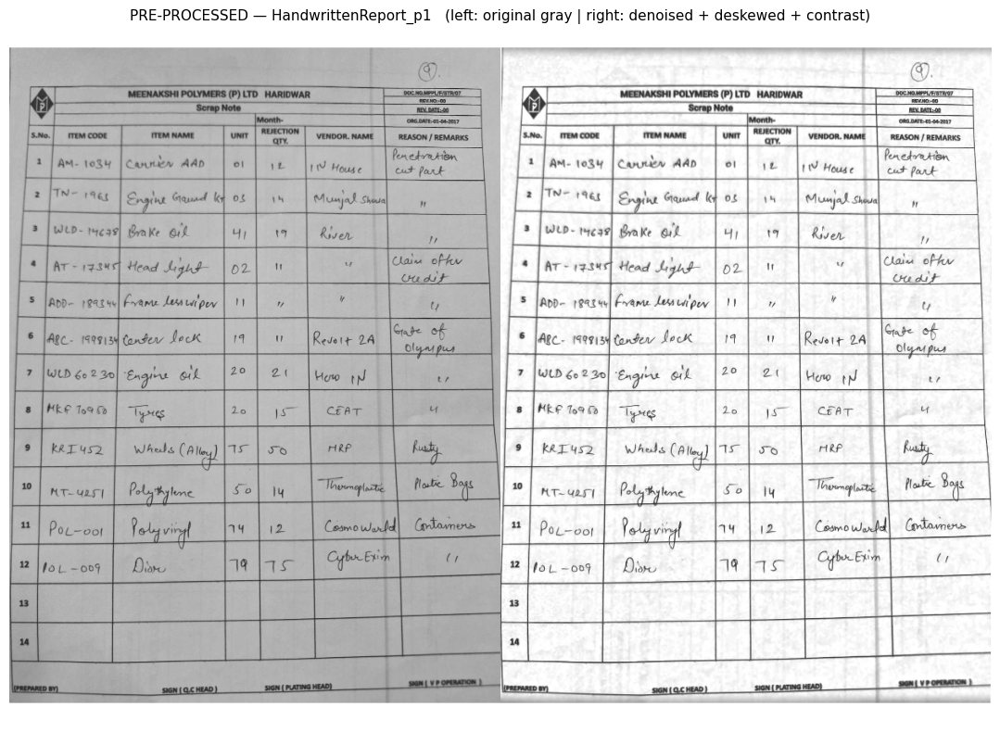

SUPPLIER LOT REJECTION SUMMARY_p1: rotated -0.17 deg, sheared +0.07 deg


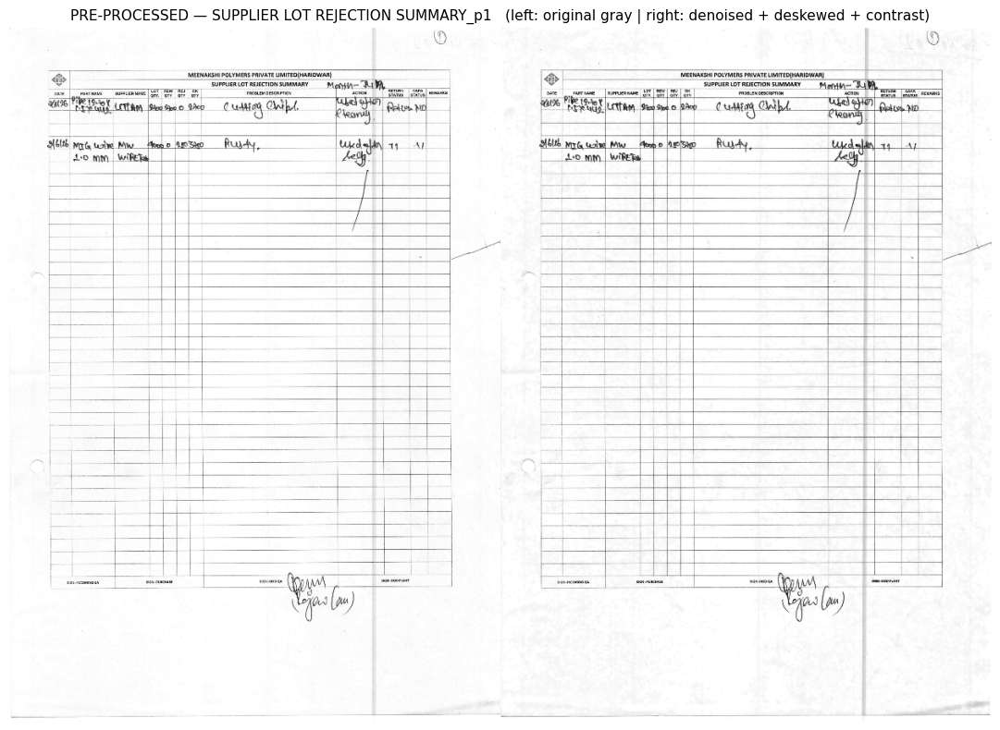

SUPPLIER REJECTION REPORT_p1: rotated -0.38 deg, sheared +0.02 deg


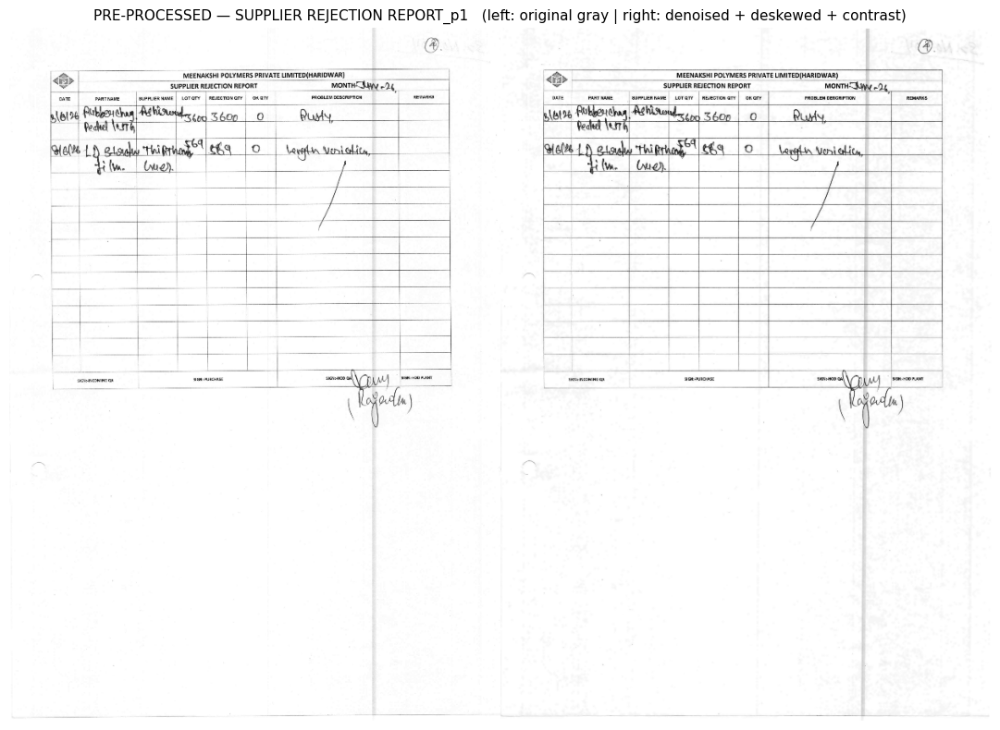

SUPPLIER REWORK REPORT_p1: rotated +0.20 deg, sheared +0.17 deg


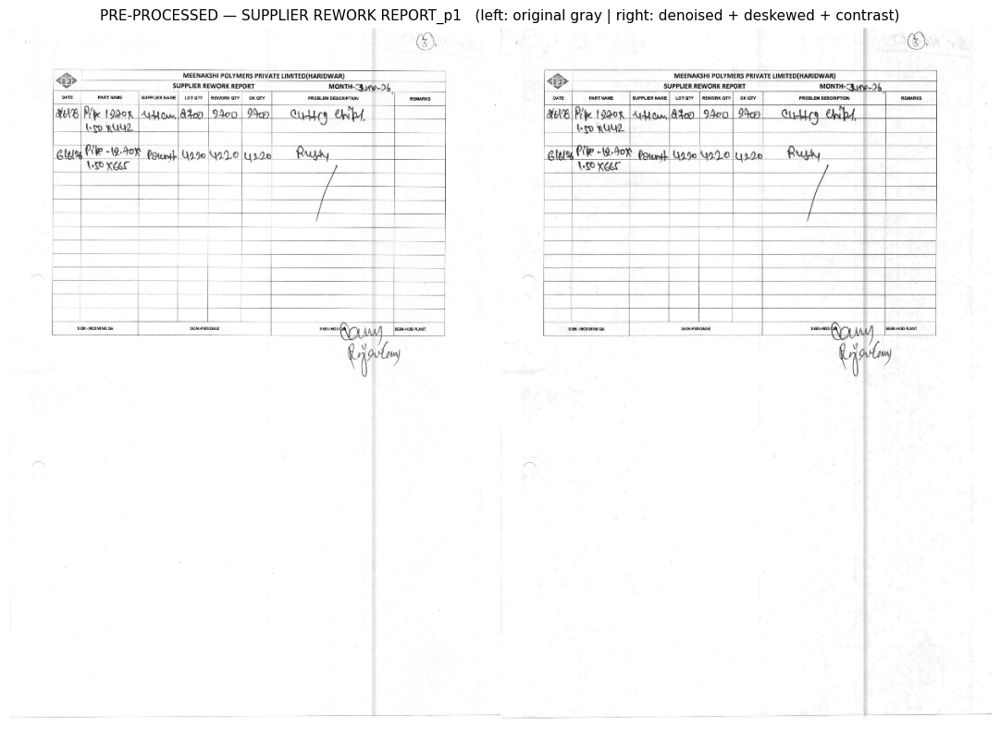

SUPPLIER SEGREGATION REPORT_p1: rotated -0.05 deg, sheared -0.08 deg


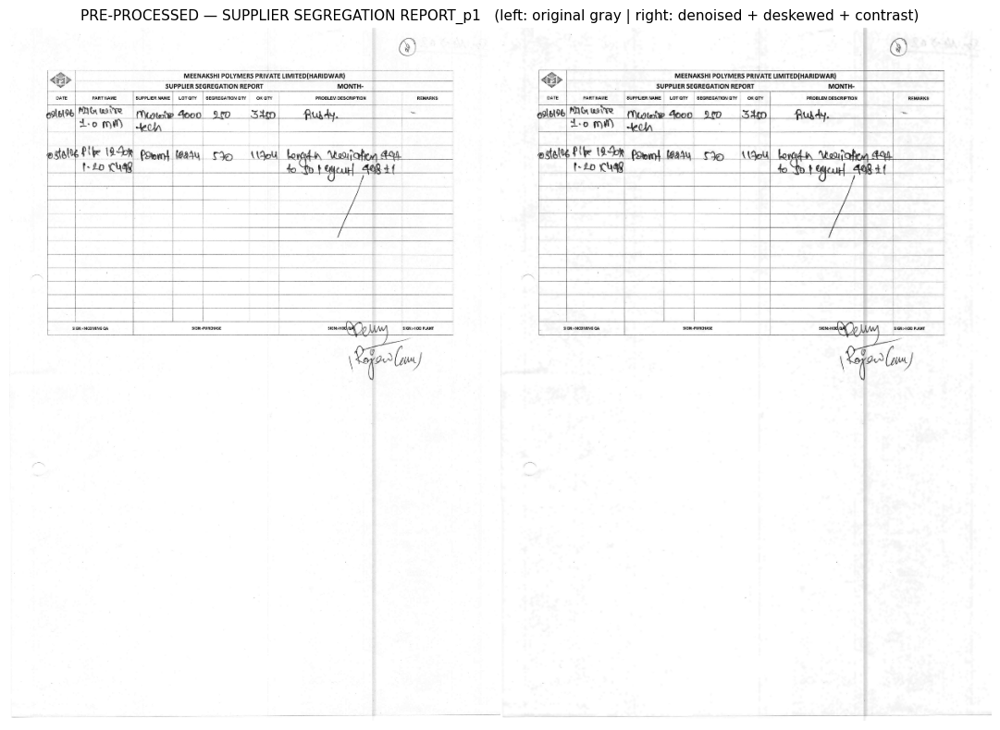

In [7]:
# ============================================================================
# STAGE 6 — PRE-PROCESSING
#   1. grayscale
#   2. denoise            (fast non-local means — removes scanner speckle but keeps pen strokes)
#   3. flatten lighting   (divide by an estimate of the paper background -> even white page, no shadows/bands)
#   4. deskew / de-shear  (rotation from the long horizontal lines + shear from the vertical lines, applied as ONE
#                          affine warp so scans of photocopied forms end up with truly level rows and upright columns)
#   5. contrast (CLAHE)   (local contrast enhancement so faint pen strokes become dark)
# Grid detection uses `flat`; the crops that go to OCR are cut from `gray` (= flat + CLAHE).
# ============================================================================
def flatten_illumination(gray):
    """Divide by the paper background. The background is estimated on a 1/4-size copy (fast) with a
    morphological closing that erases thin dark things (pen strokes, printed lines) and keeps the paper."""
    small = cv2.resize(gray, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)
    bg = cv2.morphologyEx(small, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15)))
    bg = cv2.GaussianBlur(bg, (0, 0), 6)
    bg = cv2.resize(bg, (gray.shape[1], gray.shape[0]), interpolation=cv2.INTER_LINEAR)
    return cv2.divide(gray, np.maximum(bg, 1), scale=255)


def line_masks(gray, dpi=DPI):
    """Binary ink image + masks of long horizontal / vertical strokes (the printed grid)."""
    bw = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 35, 15)
    k = int(LINE_KERNEL_IN * dpi)                       # a printed line is much longer than any pen stroke
    h = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1)))
    v = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, k)))
    return bw, h, v


def _rot_matrix(angle, w, h):
    """3x3 rotation about the page centre; positive angle = counter-clockwise."""
    return np.vstack([cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1.0), [0, 0, 1]])


def _shear_matrix(tilt, w, h):
    """3x3 horizontal shear about the middle row: x' = x - tan(tilt) * (y - h/2). Straightens verticals that lean right by `tilt`."""
    t = math.tan(math.radians(tilt))
    return np.array([[1, -t, t * h / 2], [0, 1, 0], [0, 0, 1.0]])


def _sharpness(mask, M, axis):
    """Sum of squared projection: largest when all line pixels stack into a few sharp peaks (= perfectly straight lines)."""
    h, w = mask.shape
    p = cv2.warpAffine(mask, M[:2], (w, h), flags=cv2.INTER_NEAREST).sum(axis=axis).astype(np.float64)
    return float((p * p).sum())


def _maximise(fn, lo, hi):
    """Coarse-to-fine 1-D search for the angle that maximises fn."""
    best = 0.0
    for step in (0.2, 0.05, 0.01):
        best = max(np.arange(lo, hi + 1e-9, step), key=fn)
        lo, hi = best - step, best + step
    return float(best)


def align_matrix(flat0):
    """Affine transform that levels the printed rows (rotation) and makes the printed columns upright (shear).
    Both angles are found by projection-profile search on a half-size line mask: the right angle is the one where
    the row (or column) profile is sharpest. Returns (3x3 matrix, rotation deg, shear deg)."""
    small = cv2.resize(flat0, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
    h, w = small.shape
    bw = cv2.adaptiveThreshold(small, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 25, 8)
    hm = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1)))
    vm = cv2.morphologyEx(bw, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 20)))
    rot = _maximise(lambda a: _sharpness(hm, _rot_matrix(a, w, h), axis=1), -MAX_DESKEW_DEG, MAX_DESKEW_DEG)
    R = _rot_matrix(rot, w, h)
    shear = _maximise(lambda t: _sharpness(vm, _shear_matrix(t, w, h) @ R, axis=0), -1.0, 1.0)
    H, W = flat0.shape
    return _shear_matrix(shear, W, H) @ _rot_matrix(rot, W, H), rot, shear


def warp(img, M, border):
    h, w = img.shape[:2]
    return cv2.warpAffine(img, M[:2], (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_CONSTANT, borderValue=border)


def preprocess(page):
    gray0 = cv2.cvtColor(page.original, cv2.COLOR_BGR2GRAY)                           # 1. grayscale
    den = cv2.fastNlMeansDenoising(gray0, None, h=DENOISE_H, templateWindowSize=5, searchWindowSize=11)   # 2. denoise
    flat0 = flatten_illumination(den)                                                 # 3. even lighting
    M, rot, shear = align_matrix(flat0)                                               # 4. deskew + de-shear (one warp)
    flat = warp(flat0, M, 255)
    page.aligned = warp(page.original, M, (255, 255, 255))
    page.angle = rot
    page.flat = flat
    page.gray = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=(8, 8)).apply(flat)   # 5. contrast
    page.bw, page.hmask, page.vmask = line_masks(flat)
    print(f"{page.uid}: rotated {rot:+.2f} deg, sheared {shear:+.2f} deg")


for pg in PAGES:
    t0 = time.time()
    preprocess(pg)
    if viewed(pg):
        show(np.hstack([cv2.resize(cv2.cvtColor(cv2.cvtColor(pg.original, cv2.COLOR_BGR2GRAY), cv2.COLOR_GRAY2BGR), None, fx=0.25, fy=0.25),
                        cv2.resize(to_bgr(pg.gray), None, fx=0.25, fy=0.25)]),
             f"PRE-PROCESSED — {pg.uid}   (left: original gray | right: denoised + deskewed + contrast)", figsize=(12, 8))
        save_debug(pg, "02_preprocessed.png", pg.gray)


HandwrittenReport_p1: table bbox = (0, 285, 2480, 3374)


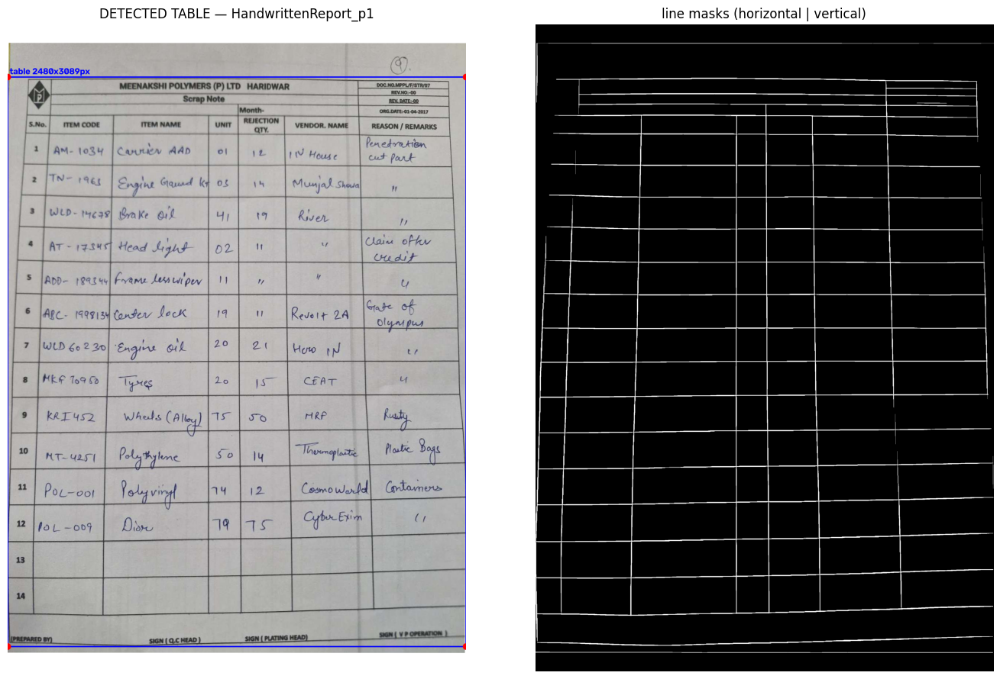

SUPPLIER LOT REJECTION SUMMARY_p1: table bbox = (198, 210, 2237, 2839)


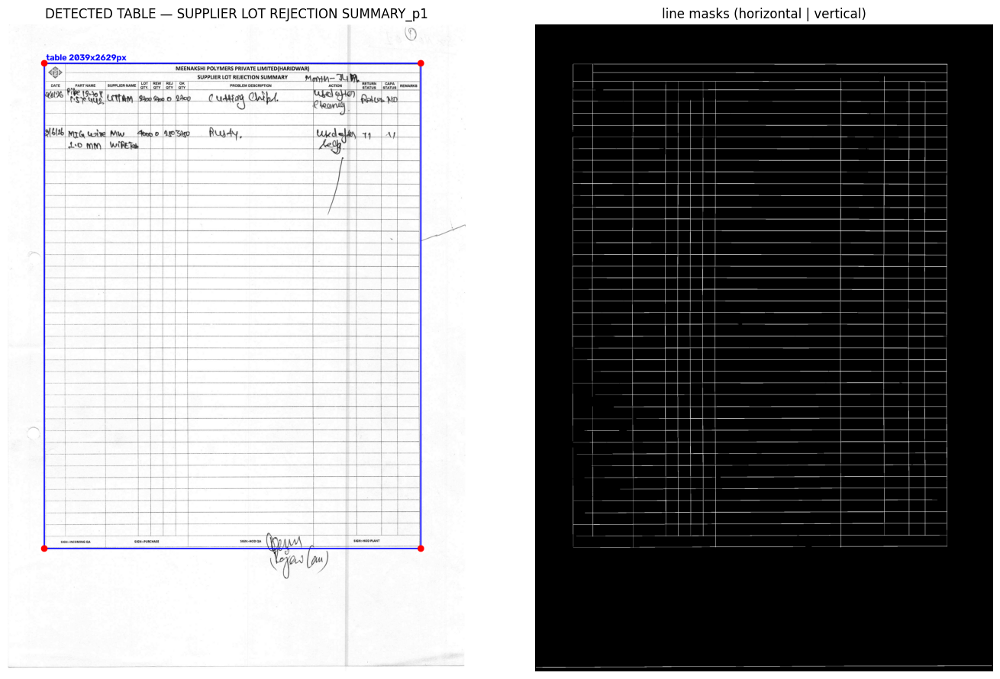

SUPPLIER REJECTION REPORT_p1: table bbox = (213, 208, 2239, 1828)


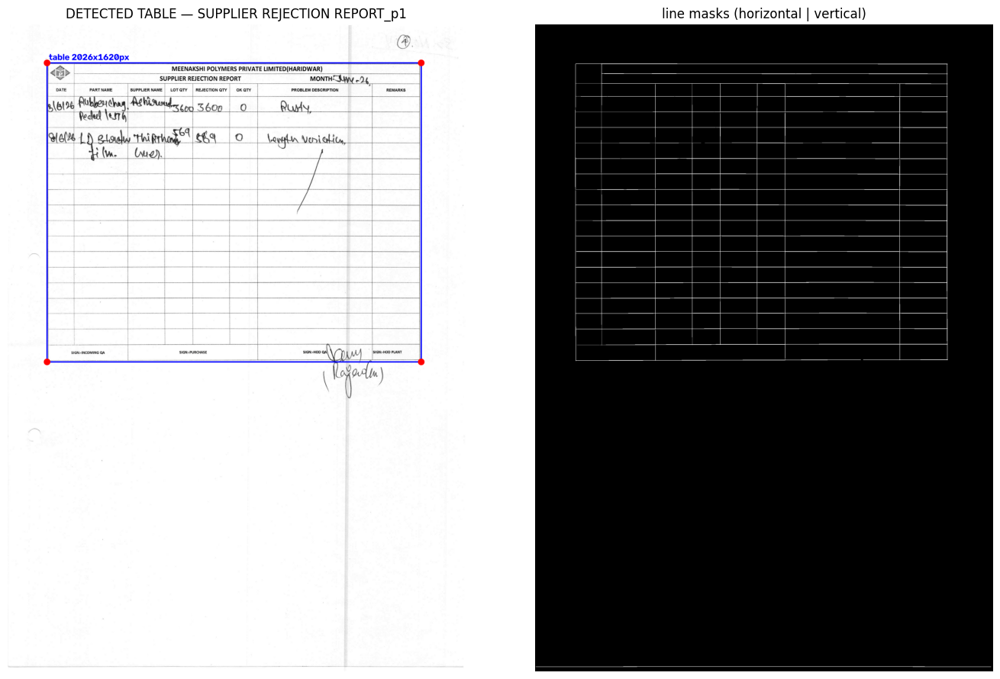

SUPPLIER REWORK REPORT_p1: table bbox = (213, 210, 2210, 1564)


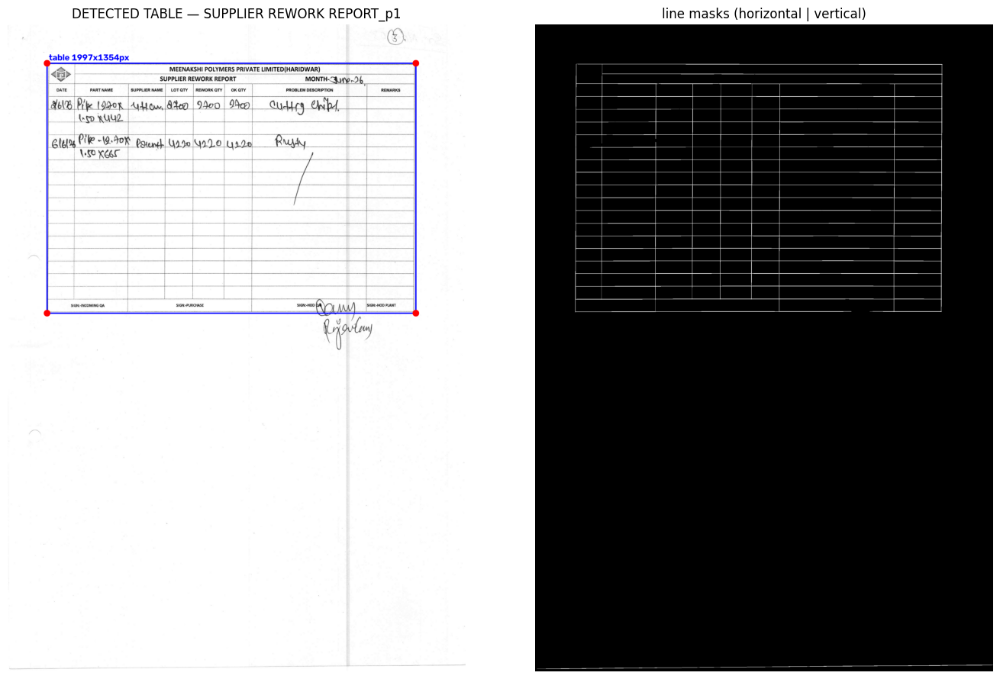

SUPPLIER SEGREGATION REPORT_p1: table bbox = (188, 210, 2246, 1562)


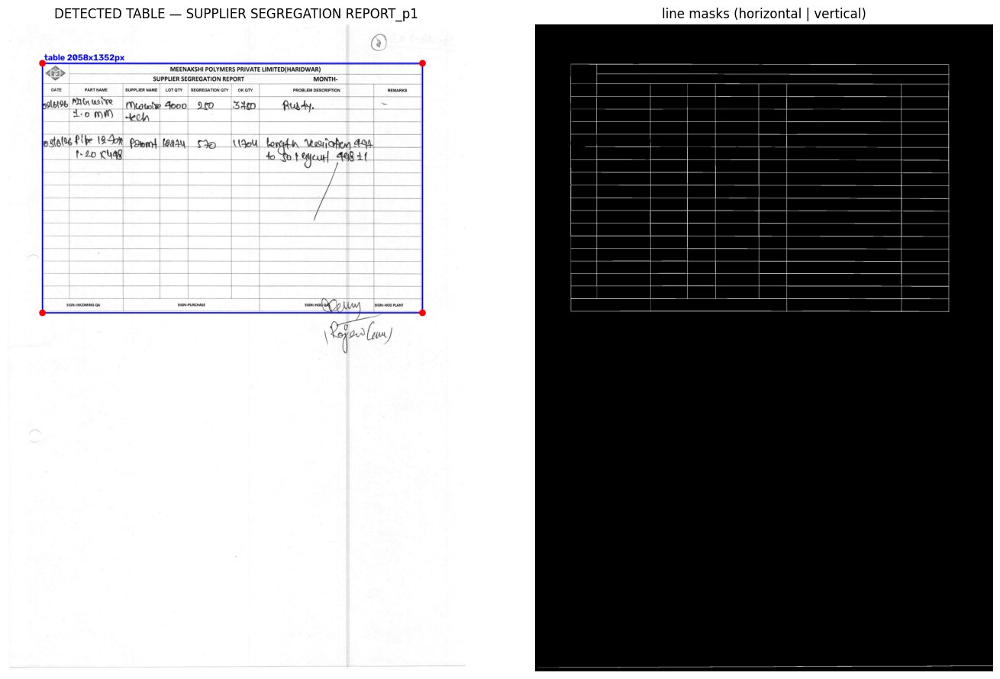

In [8]:
# ============================================================================
# STAGE 7 — TABLE DETECTION / ALIGNMENT
# The printed grid lines (horizontal | vertical masks from Stage 6) are merged; the biggest connected blob is the
# table. Its bounding box gives the table's left/top/right/bottom. (The page is already rotation-aligned by Stage 6.)
# ============================================================================
def detect_table(page):
    grid_mask = cv2.dilate(cv2.bitwise_or(page.hmask, page.vmask), np.ones((9, 9), np.uint8))
    n, _, stats, _ = cv2.connectedComponentsWithStats(grid_mask)
    if n < 2:
        raise RuntimeError("no table-like structure found")
    k = 1 + int(np.argmax(stats[1:, cv2.CC_STAT_AREA]))
    x, y, w, h = stats[k, :4]
    return (int(x), int(y), int(x + w), int(y + h))


def draw_table(page):
    vis = page.aligned.copy()
    x1, y1, x2, y2 = page.table_bbox
    cv2.rectangle(vis, (x1, y1), (x2, y2), (255, 0, 0), 6)
    for (cx, cy) in [(x1, y1), (x2, y1), (x1, y2), (x2, y2)]:
        cv2.circle(vis, (cx, cy), 18, (0, 0, 255), -1)
    cv2.putText(vis, f"table {x2-x1}x{y2-y1}px", (x1 + 10, max(40, y1 - 15)), cv2.FONT_HERSHEY_SIMPLEX, 1.6, (255, 0, 0), 4)
    return vis


for pg in PAGES:
    try:
        pg.table_bbox = detect_table(pg)
    except Exception as e:
        pg.warnings.append(f"table detection failed: {e}")
        print(f"{pg.uid}: TABLE NOT FOUND — {e}")
        continue
    print(f"{pg.uid}: table bbox = {pg.table_bbox}")
    vis = draw_table(pg)
    save_debug(pg, "03_table_detected.png", vis)
    save_debug(pg, "03b_line_masks.png", cv2.bitwise_or(pg.hmask, pg.vmask))
    if viewed(pg) and SHOW_DEBUG:
        fig, ax = plt.subplots(1, 2, figsize=(14, 9))
        ax[0].imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)); ax[0].set_title(f"DETECTED TABLE — {pg.uid}")
        ax[1].imshow(cv2.bitwise_or(pg.hmask, pg.vmask), cmap="gray"); ax[1].set_title("line masks (horizontal | vertical)")
        for a in ax: a.axis("off")
        plt.tight_layout(); plt.show()


In [9]:
# ============================================================================
# STAGE 7b — IDENTIFY THE FORM FROM THE PAGE  (only for files the name did not identify)
# The file name is a poor key: a scan called "HandwrittenReport.pdf" matches no template and used to be skipped.
# Two signals on the page itself are enough, and they are tried in that order because the first is free:
#   1. STRUCTURE - how many columns the printed grid has. On these forms that alone settles it whenever the count
#      is unique (the lot-rejection form has 12, the weld-shop one 7).
#   2. HEADING   - when several templates share a column count (rework / segregation / supplier-rejection all have
#      8), the block printed above the first data row is read with the OCR model and matched against each
#      template's `match` fragments and column names. That text is PRINTED, so it reads far more reliably than the
#      handwriting does.
# A page that still cannot be identified keeps template = {} and is skipped by Stage 8 with a warning, rather than
# being forced into the wrong template.
# ============================================================================
def ensure_got():
    """Load GOT-OCR-2.0 once, into module globals. Safe to call again - Stage 14 calls it too."""
    global got_processor, got_model, device
    if "got_model" in globals() and got_model is not None:
        return
    import torch as _torch
    from transformers import AutoProcessor, AutoModelForImageTextToText
    globals()["torch"] = _torch
    device = "cuda" if _torch.cuda.is_available() else "cpu"
    if device == "cpu":
        print("WARNING: no GPU — GOT-OCR-2.0 will be slow on CPU.")
    print("Loading GOT-OCR-2.0 ...")
    got_processor = load_pretrained(AutoProcessor, GOT_MODEL_ID)
    got_model = AutoModelForImageTextToText.from_pretrained(
        GOT_MODEL_ID, device_map="auto", dtype=_torch.float16 if device == "cuda" else _torch.float32)
    got_model.eval()


def got_generate(img, max_new_tokens, no_repeat_ngram=0):
    """Run GOT on one grayscale image -> (text, mean per-token probability). The one place generate() is called."""
    ensure_got()
    image = Image.fromarray(img).convert("RGB")
    inputs = got_processor(image, return_tensors="pt")
    inputs = {k: v.to(got_model.device) if hasattr(v, "to") else v for k, v in inputs.items()}
    with torch.inference_mode():
        out = got_model.generate(**inputs, do_sample=False, tokenizer=got_processor.tokenizer,
                                 stop_strings="<|im_end|>", max_new_tokens=max_new_tokens,
                                 no_repeat_ngram_size=no_repeat_ngram or 0,
                                 output_scores=True, return_dict_in_generate=True)
    new_ids = out.sequences[0][inputs["input_ids"].shape[1]:]
    text = got_processor.decode(new_ids, skip_special_tokens=True).strip()
    special = set(got_processor.tokenizer.all_special_ids)
    probs = [torch.softmax(step[0], dim=-1)[t].item() for step, t in zip(out.scores, new_ids)
             if t.item() not in special]
    return text, (float(np.mean(probs)) if probs else None)


def count_columns(page):
    """How many columns the printed grid has, WITHOUT knowing the form. None if no stable answer.

    Stage 8 sweeps the coverage threshold until the line count matches the template. Here there is nothing to match,
    so the count that survives the widest range of thresholds wins: a real grid holds its line count over many
    thresholds, while a count produced by noise appears at one threshold and vanishes at the next.
    """
    x1, y1, x2, y2 = page.table_bbox
    H = y2 - y1
    band = page.vmask[y1 + int(0.25 * H): y1 + int(0.85 * H), max(x1 - 5, 0): x2 + 6] > 0
    if band.size == 0:
        return None
    cover = band.sum(0) / band.shape[0]
    votes = {}
    for thr in np.arange(0.80, 0.14, -0.02):
        n = len(group_peaks(cover, float(thr)))
        if n >= 4:                                          # a form has at least 3 columns
            votes[n] = votes.get(n, 0) + 1
    if not votes:
        return None
    lines = max(votes.items(), key=lambda kv: kv[1])[0]
    return lines - 1                                        # N+1 printed lines -> N columns


def read_form_heading(page):
    """The printed block above the data rows (company name, form title, column headers) as one string."""
    x1, y1, x2, y2 = page.table_bbox
    top = max(y1 - int(0.05 * page.gray.shape[0]), 0)       # some forms print the title just outside the grid
    bottom = min(y1 + int(0.22 * (y2 - y1)), y2)
    band = page.gray[top:bottom, x1:x2]
    if band.size == 0:
        return ""
    scale = min(1.0, 1000.0 / max(band.shape[1], 1))        # a full-width banner is wider than the model needs
    if scale < 1.0:
        band = cv2.resize(band, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    text, _ = got_generate(band, 256)
    return text


def _norm_words(s):
    return re.sub(r"\s+", " ", re.sub(r"[^A-Z0-9 ]+", " ", str(s).upper())).strip()


def template_score(heading, template):
    """How well a heading matches one template: its `match` fragments count most, its column names confirm."""
    text = _norm_words(heading)
    score = 5 * sum(1 for m in template["match"] if _norm_words(m) in text)
    score += sum(1 for c in template["columns"] if len(_norm_words(c)) > 2 and _norm_words(c) in text)
    return score


def identify_template(page):
    """(template key, why) for a page whose file name told us nothing. (None, why) when it stays unknown."""
    n = count_columns(page)
    candidates = [k for k, t in TEMPLATES.items() if len(t["columns"]) == n] if n else []
    if len(candidates) == 1:
        return candidates[0], f"{n} columns - only {candidates[0]} has that many"

    heading = read_form_heading(page)
    pool = candidates or list(TEMPLATES)
    ranked = sorted(((template_score(heading, TEMPLATES[k]), k) for k in pool), reverse=True)
    best, key = ranked[0]
    if best <= 0:
        return None, f"{n} columns, heading {heading[:50]!r} matched no template"
    runner = ranked[1][0] if len(ranked) > 1 else 0
    return key, (f"{n} columns -> {len(pool)} candidates; heading matched {key} "
                 f"(score {best} vs next {runner})")


for pg in PAGES:
    if pg.template or pg.table_bbox is None:
        continue
    key, why = identify_template(pg)
    if key:
        pg.template_key, pg.template = key, TEMPLATES[key]
        print(f"{pg.uid}: identified as {key}  ({why})")
    else:
        pg.warnings.append(f"form not identified: {why}")
        print(f"{pg.uid}: COULD NOT IDENTIFY THE FORM ({why})\n"
              f"    -> add a template in Stage 2, or pin it with TEMPLATE_BY_FILE[{pg.pdf!r}]")


Loading GOT-OCR-2.0 ...


preprocessor_config.json:   0%|          | 0.00/439 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/18.7M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/213 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/608 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.12G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/74.0 [00:00<?, ?B/s]

HandwrittenReport_p1: identified as weld_shop_rejection_report  (4 columns -> 5 candidates; heading matched weld_shop_rejection_report (score 5 vs next 2))


In [10]:
# ============================================================================
# STAGE 8 — DETECT HORIZONTAL ROWS AND VERTICAL COLUMNS
# Projection profiles: for every x we measure what fraction of the table body is covered by the vertical-line mask
# (and for every y the fraction of the table width covered by the horizontal-line mask). Real grid lines are
# ~55-65 % covered, handwriting/noise is < 25 %.
#   * columns : the coverage threshold is swept downward until we get exactly N+1 vertical lines (N = names in template)
#   * rows    : darkness profile of the table width (robust to faint / curved scanned lines); the header/body split is the
#               bottom of the first row band that every column line crosses, the data area ends where the column lines end
#   * missing faint row lines are re-inserted when a gap is (almost) an integer multiple of the row pitch
# ============================================================================
def get_manual(page):
    """Manual override dict for this page (PDF stem wins over template key)."""
    stem = os.path.splitext(page.pdf)[0]
    return MANUAL_CONFIG.get(stem) or MANUAL_CONFIG.get(page.template_key) or {}


def detect_columns(page, n_expected):
    x1, y1, x2, y2 = page.table_bbox
    H = y2 - y1
    band = page.vmask[y1 + int(0.25 * H): y1 + int(0.85 * H), max(x1 - 5, 0): x2 + 6] > 0   # middle of the body
    cover = band.sum(0) / band.shape[0]
    off = max(x1 - 5, 0)
    best = None
    for thr in np.arange(0.80, 0.14, -0.05):
        pk = [p + off for p in group_peaks(cover, thr)]
        if len(pk) == n_expected + 1:
            return pk, float(thr)
        if best is None or abs(len(pk) - (n_expected + 1)) < abs(len(best[0]) - (n_expected + 1)):
            best = (pk, float(thr))
    return best


def line_vertical_extent(page, xs):
    """Top / bottom y of each vertical line (uses the vertical mask in a +-5 px window around x)."""
    x1, y1, x2, y2 = page.table_bbox
    tops, bottoms = [], []
    for x in xs:
        xi = int(round(x))
        ys = np.flatnonzero((page.vmask[y1: y2 + 1, max(xi - 5, 0): xi + 6] > 0).any(axis=1))
        tops.append(y1 + int(ys[0]) if ys.size else y1)
        bottoms.append(y1 + int(ys[-1]) if ys.size else y2)
    return tops, bottoms


def row_line_positions(page, x1, x2, y1, y2, n_chunks=16, pct=35, min_cover=0.20):
    """y-positions of the printed horizontal lines between y1 and y2. Two independent signals must agree:
      (a) morphological : fraction of the table width covered by the long-horizontal-run mask (>= min_cover). Text rows
                          are ~0, good lines ~0.6, faint scanned lines still ~0.3.
      (b) darkness      : (255 - flattened gray) of the table width, split into n_chunks slabs; the pct-th percentile
                          ACROSS slabs is high only where a stroke crosses most of the width (a printed line), so
                          handwriting confined to a few cells and header text do not qualify.
    Requiring both is robust to faint / slightly curved lines (a) and to bold header text (b)."""
    y1, y2 = max(y1, 0), min(y2, page.flat.shape[0])
    band = page.hmask[y1:y2, x1:x2] > 0
    cover = band.sum(1) / band.shape[1]
    cover = np.maximum.reduce([np.roll(cover, s) for s in (-2, -1, 0, 1, 2)])          # tolerate 1-2 px of line drift
    reg = 255.0 - page.flat[y1:y2, x1:x2].astype(np.float32)
    dark = np.percentile(np.stack([c.mean(axis=1) for c in np.array_split(reg, n_chunks, axis=1)]), pct, axis=0)
    dark = np.convolve(dark, np.ones(3) / 3, mode="same")
    dark = np.maximum.reduce([np.roll(dark, s) for s in (-2, -1, 0, 1, 2)])
    lines = [p for p in group_peaks(cover, min_cover, min_gap=6) if dark[int(round(p))] >= 10.0]
    return [p + y1 for p in lines], min_cover


def band_has_all_cols(page, ya, yb, cols, min_frac=0.85):
    """True if (almost) every column line crosses the horizontal band ya..yb — used to find the header-name row.
    A +-8 px window and min_frac < 1 tolerate a line that is a few px off or lost in one header cell."""
    ya, yb = int(ya) + 6, int(yb) - 6
    if yb <= ya:
        return False
    ok = 0
    for x in cols:
        xi = int(round(x))
        ok += (page.vmask[ya:yb, max(xi - 8, 0): xi + 9] > 0).any(axis=1).mean() >= 0.7
    return ok >= min_frac * len(cols)


def fill_missing_rows(lines):
    """Insert lines where a gap is ~k x the median pitch (k = 2..4) — a faint / broken printed line."""
    if len(lines) < 4:
        return lines
    pitch = float(np.median(np.diff(lines)))
    out = [lines[0]]
    for a, b in zip(lines[:-1], lines[1:]):
        k = int(round((b - a) / pitch))
        if k >= 2 and abs((b - a) - k * pitch) < 0.18 * pitch:
            out += [a + (b - a) * j / k for j in range(1, k)]
        out.append(b)
    return out


def detect_rows_and_cols(page):
    man = get_manual(page)
    names = man.get("header_names") or page.template["columns"]
    n = len(names)
    cols, thr = detect_columns(page, n)
    x1, y1, x2, y2 = page.table_bbox
    d = dict(cols=cols, col_thr=thr, n_expected=n)

    # where the column lines end -> bottom of the data area (top of the signature / footer row)
    interior = cols[1:-1] if len(cols) > 2 else cols
    _, bottoms = line_vertical_extent(page, interior)
    body_end = float(np.median(bottoms))

    # all horizontal grid lines across the width spanned by the columns
    rows_all, rthr = row_line_positions(page, int(min(cols)) + 8, int(max(cols)) - 8, y1 - 6, y2 + 7)

    # header-name row = first band crossed by ALL column lines; the data area starts at its bottom line
    body_top = None
    for a, b_ in zip(rows_all[:-1], rows_all[1:]):
        if b_ - a > 25 and band_has_all_cols(page, a, b_, cols):
            body_top = b_
            d["names_band"] = (a, b_)
            break
    body = [r for r in rows_all if body_top is not None and body_top - 6 <= r <= body_end + 15]
    body = fill_missing_rows(body)
    if len(body) >= 4:                                     # faint tail: continue at the median pitch down to the footer line
        pitch = float(np.median(np.diff(body)))
        while body_end - body[-1] > 0.6 * pitch:
            body.append(body[-1] + pitch)
        if abs(body[-1] - body_end) < 0.4 * pitch:
            body[-1] = body_end
    d.update(body_end=body_end, rows_all=rows_all, row_thr=rthr, body_top=body_top, body_rows=body)
    page.detect = d
    return d


for pg in PAGES:
    if pg.table_bbox is None or not pg.template:
        continue
    d = detect_rows_and_cols(pg)
    print(f"{pg.uid}: {len(d['cols'])} vertical lines (expected {d['n_expected'] + 1}, coverage thr {d['col_thr']:.2f}) | "
          f"header-name row {d.get('names_band')}, body_top={d['body_top']}, {max(len(d['body_rows']) - 1, 0)} body rows")


HandwrittenReport_p1: 7 vertical lines (expected 8, coverage thr 0.15) | header-name row None, body_top=None, 0 body rows
SUPPLIER LOT REJECTION SUMMARY_p1: 13 vertical lines (expected 13, coverage thr 0.60) | header-name row (307.97924511778615, 354.3733628028815), body_top=354.3733628028815, 38 body rows
SUPPLIER REJECTION REPORT_p1: 9 vertical lines (expected 9, coverage thr 0.80) | header-name row (319.9182670835194, 389.78320832325187), body_top=389.78320832325187, 16 body rows
SUPPLIER REWORK REPORT_p1: 9 vertical lines (expected 9, coverage thr 0.70) | header-name row (321.10317460317464, 389.82886064030134), body_top=389.82886064030134, 16 body rows
SUPPLIER SEGREGATION REPORT_p1: 9 vertical lines (expected 9, coverage thr 0.80) | header-name row (321.31998822490436, 390.34733398178446), body_top=390.34733398178446, 16 body rows


HandwrittenReport_p1: 7 columns (manual), 14 body rows (manual pitch), median row pitch 186px, body y 593..3197
   col_x = [60, 210, 537, 1085, 1255, 1521, 1902, 2360]
   names = ['S.NO', 'ITEM CODE', 'ITEM NAME', 'UNIT', 'REJECTION QTY', 'VENDOR NAME', 'REASON / REMARKS']


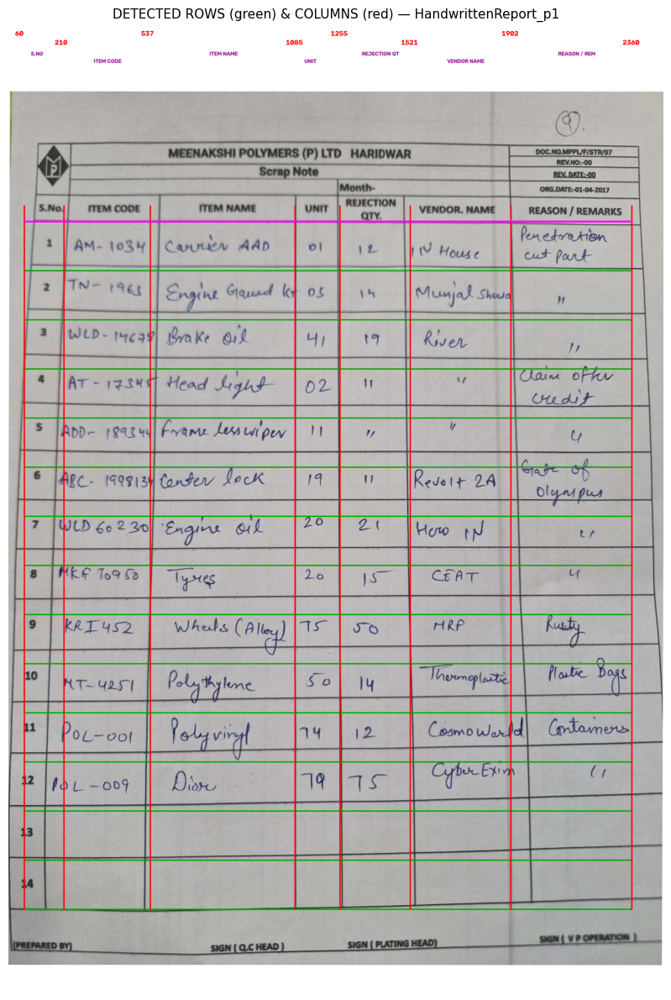

SUPPLIER LOT REJECTION SUMMARY_p1: 12 columns (auto), 38 body rows (auto), median row pitch 64px, body y 354..2772
   col_x = [203, 310, 527, 705, 772, 839, 907, 974, 1653, 1888, 2022, 2109, 2227]
   names = ['DATE', 'PART NAME', 'SUPPLIER NAME', 'LOT QTY', 'REW QTY', 'REJ QTY', 'OK QTY', 'PROBLEM DESCRIPTION', 'ACTION', 'RETURN STATUS', 'CAPA STATUS', 'REMARKS']


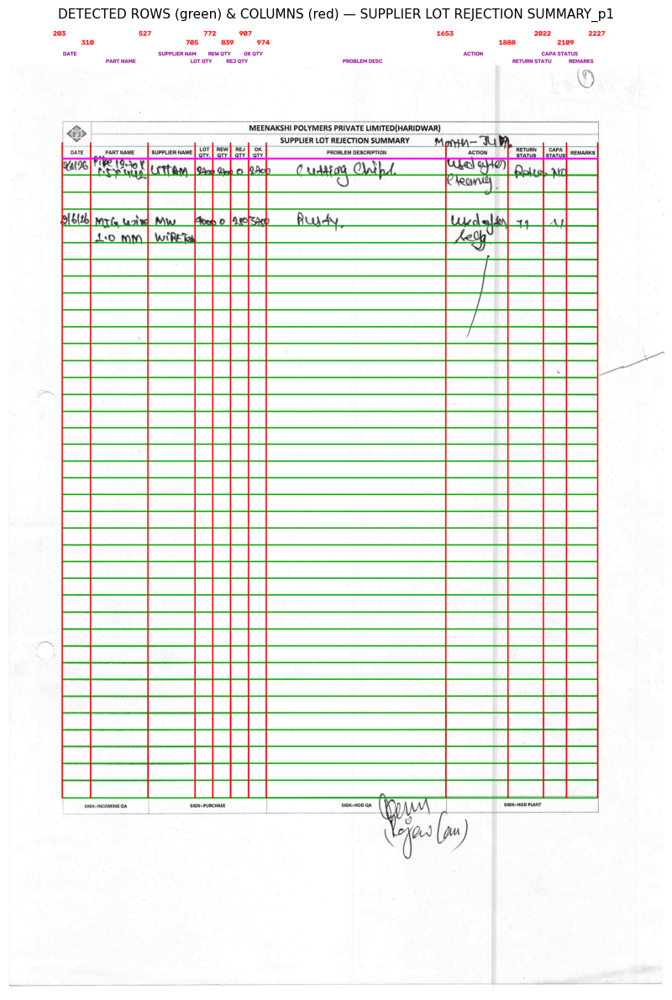

SUPPLIER REJECTION REPORT_p1: 8 columns (auto), 16 body rows (auto), median row pitch 84px, body y 390..1738
   col_x = [218, 359, 650, 850, 1001, 1201, 1352, 1973, 2230]
   names = ['DATE', 'PART NAME', 'SUPPLIER NAME', 'LOT QTY', 'REJECTION QTY', 'OK QTY', 'PROBLEM DESCRIPTION', 'REMARKS']


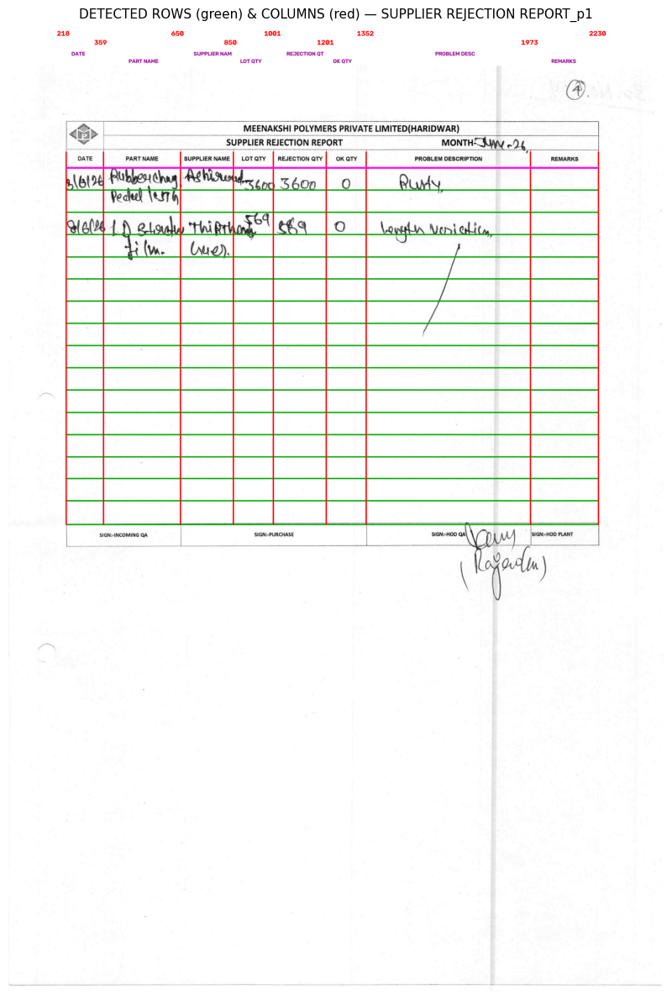

SUPPLIER REWORK REPORT_p1: 8 columns (auto), 16 body rows (auto), median row pitch 68px, body y 390..1490
   col_x = [219, 360, 652, 852, 1003, 1172, 1323, 1944, 2200]
   names = ['DATE', 'PART NAME', 'SUPPLIER NAME', 'LOT QTY', 'REWORK QTY', 'OK QTY', 'PROBLEM DESCRIPTION', 'REMARKS']


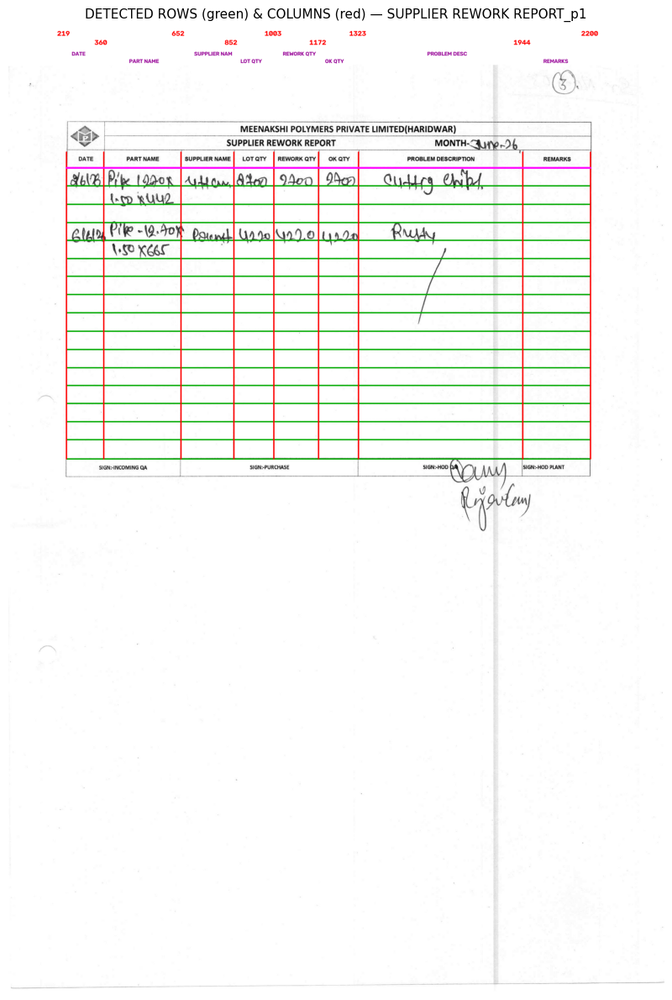

SUPPLIER SEGREGATION REPORT_p1: 8 columns (auto), 16 body rows (auto), median row pitch 68px, body y 390..1487
   col_x = [193, 333, 624, 824, 975, 1211, 1362, 1982, 2239]
   names = ['DATE', 'PART NAME', 'SUPPLIER NAME', 'LOT QTY', 'SEGREGATION QTY', 'OK QTY', 'PROBLEM DESCRIPTION', 'REMARKS']


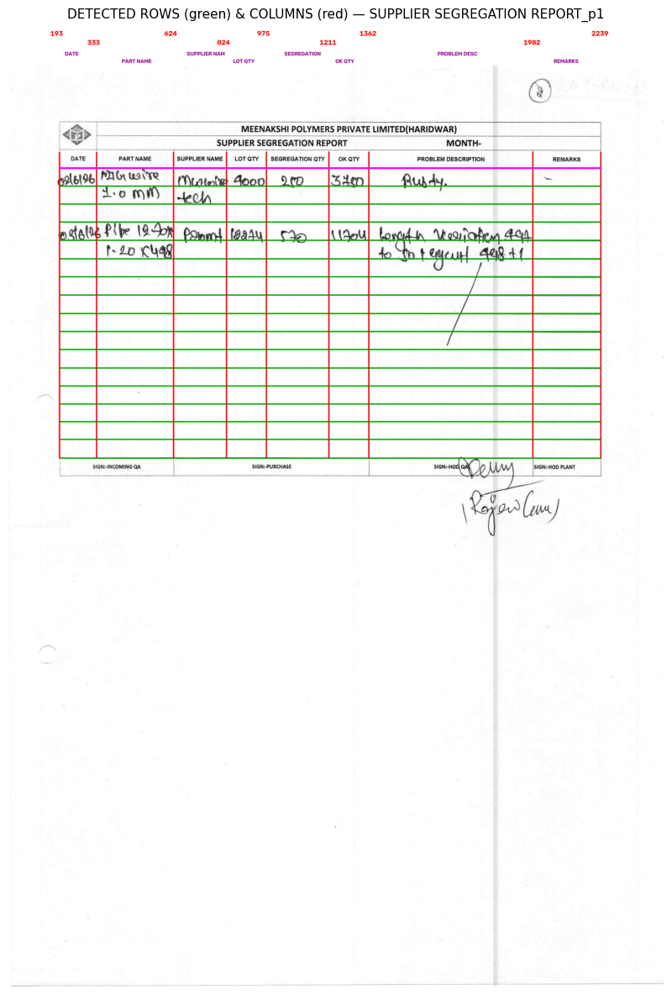

In [11]:
# ============================================================================
# STAGE 9 — RESOLVE THE GRID  (auto-detection + template names + manual overrides)
# Produces page.grid = {col_x, col_names, row_y, table_right ...}. Anything in MANUAL_CONFIG (Stage 3) wins.
# If the number of vertical lines does not match the template, the page is flagged and skipped by later stages —
# fill MANUAL_CONFIG for it and re-run from this stage.
# ============================================================================
def resolve_grid(page):
    man = get_manual(page)
    d = page.detect
    names = list(man.get("header_names") or page.template["columns"])
    n = len(names)
    x1, y1, x2, y2 = page.table_bbox
    notes, src = [], {}

    # ---- columns -----------------------------------------------------------------------------------------
    if man.get("col_x"):
        col_x = [float(v) for v in man["col_x"]]
        if len(col_x) == n:
            col_x.append(float(x2))                          # left edges only -> table right edge closes the last column
        src["cols"] = "manual"
    else:
        col_x = list(d["cols"])
        if len(col_x) == n:                                  # right border line not detected -> use table bbox edge
            col_x.append(float(x2)); notes.append("right border not detected; using table bbox edge")
        src["cols"] = "auto"
    if len(col_x) != n + 1:
        raise ValueError(f"found {len(col_x)} vertical lines for {n} columns ({n + 1} needed). "
                         f"Detected x = {[int(v) for v in col_x]}. Set MANUAL_CONFIG col_x for '{os.path.splitext(page.pdf)[0]}'.")
    col_x = sorted(col_x)

    # ---- rows ---------------------------------------------------------------------------------------------
    body_top = man.get("body_top", d["body_top"])
    if body_top is None:
        raise ValueError("could not find the header/body boundary; set body_top in MANUAL_CONFIG")
    if man.get("row_y"):
        row_y = sorted(float(v) for v in man["row_y"]); src["rows"] = "manual"
    else:
        rows = list(d["body_rows"])
        if "body_bottom" in man or "body_top" in man:
            lo, hi = body_top - 6, man.get("body_bottom", rows[-1] if rows else body_top) + 6
            rows = [r for r in d["rows_all"] if lo <= r <= hi]
        if man.get("row_pitch"):                             # uniform grid between body_top and body_bottom
            bottom = man.get("body_bottom", rows[-1] if rows else body_top)
            k = max(1, round((bottom - body_top) / man["row_pitch"]))
            rows = list(np.linspace(body_top, bottom, k + 1)); src["rows"] = "manual pitch"
        else:
            src["rows"] = "manual range" if ("body_bottom" in man or "body_top" in man) else "auto"
        row_y = fill_missing_rows(rows)
    if len(row_y) < 2:
        raise ValueError("fewer than 2 row lines in the body; set row_y / body_top / body_bottom in MANUAL_CONFIG")

    page.grid = dict(col_x=col_x, col_names=names, row_y=[float(r) for r in row_y], body_top=float(row_y[0]),
                     body_bottom=float(row_y[-1]), table_bbox=list(page.table_bbox),
                     table_right=float(max(col_x[-1], x2)), source=src, notes=notes)
    return page.grid


def draw_grid(page):
    """Aligned page + white strip on top carrying the column names and the x of every column line."""
    g = page.grid
    strip = 150
    vis = cv2.copyMakeBorder(page.aligned, strip, 0, 0, 0, cv2.BORDER_CONSTANT, value=(255, 255, 255))
    top, bot = int(g["body_top"]) + strip, int(g["body_bottom"]) + strip
    for y in g["row_y"]:
        cv2.line(vis, (int(g["col_x"][0]), int(y) + strip), (int(g["col_x"][-1]), int(y) + strip), (0, 170, 0), 3)   # rows = green
    for i, x in enumerate(g["col_x"]):
        cv2.line(vis, (int(x), top - 60), (int(x), bot), (0, 0, 255), 4)                                               # columns = red
        cv2.putText(vis, str(int(x)), (int(x) - 35, 40 + (i % 2) * 34), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
    for i, name in enumerate(g["col_names"]):
        cx = int((g["col_x"][i] + g["col_x"][i + 1]) / 2)
        cv2.putText(vis, name[:12], (max(cx - 50, 0), 115 + (i % 2) * 28), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (150, 0, 150), 2)
    cv2.line(vis, (int(g["col_x"][0]), int(g["body_top"]) + strip), (int(g["col_x"][-1]), int(g["body_top"]) + strip), (255, 0, 255), 6)  # header|body
    return vis


for pg in PAGES:
    if pg.table_bbox is None:
        continue
    try:
        g = resolve_grid(pg)
    except Exception as e:
        pg.grid = {}
        pg.warnings.append(str(e))
        print(f"{pg.uid}: GRID FAILED — {e}")
        continue
    pitch = float(np.median(np.diff(g["row_y"])))
    print(f"{pg.uid}: {len(g['col_names'])} columns ({g['source']['cols']}), {len(g['row_y']) - 1} body rows ({g['source']['rows']}), "
          f"median row pitch {pitch:.0f}px, body y {g['body_top']:.0f}..{g['body_bottom']:.0f}")
    print("   col_x =", [int(v) for v in g["col_x"]])
    print("   names =", g["col_names"])
    for note in g["notes"]:
        print("   note:", note)
    vis = draw_grid(pg)
    save_debug(pg, "04_rows_columns.png", vis)
    if viewed(pg):
        show(vis, f"DETECTED ROWS (green) & COLUMNS (red) — {pg.uid}", figsize=(9, 12))


In [12]:
# ============================================================================
# STAGE 10 — COLUMN CROPS  (one crop per column, spanning the whole data area)
# This is where this notebook parts company with the cell-wise one: instead of a crop per (record, column) the
# page is cut into as many images as the form has columns, each one running from the first data row to the last.
#
#     left  = x1 - padding          right = x2 + padding
#     top   = body_top - headroom   bottom = body_bottom + V_PADDING
#
# The horizontal rules are the same as in the cell-wise notebook, and for the same reasons:
#   * a crop grows past the printed line for as long as the ink continues, stopping at a white gutter, because the
#     narrow QTY columns are too tight for a 4-digit number and the writing spills over the line;
#   * the top of the strip reaches above the header/body line only as far as there is room, so that handwriting
#     rising above it is not chopped while the printed column name is left out.
# The whole data area acts as one tall "record" for the purpose of those measurements.
# ============================================================================
def record_ink_profile(page, rec):
    """(ink pixels per x inside this record's rows, mask of the printed column lines).

    The printed HORIZONTAL lines run the full width of the page, so their rows are dropped first — otherwise every
    column would look inked. The printed VERTICAL lines are not dropped but flagged: when the scan walks outwards
    they must be stepped over, since the line itself says nothing about where the handwriting ends.
    """
    g = page.grid
    H, W = page.gray.shape
    y1, y2 = max(int(rec["y1"]), 0), min(int(rec["y2"]), H)
    band = (page.gray[y1:y2] < INK_GRAY_THRESH).astype(np.uint8)
    for y in g["row_y"]:                                    # the rows where a printed line is expected
        yy = int(round(y)) - y1
        lo, hi = max(yy - LINE_HALF_PX, 0), yy + LINE_HALF_PX + 1
        if hi > 0 and lo < band.shape[0]:
            band[lo:hi] = 0
    # a scan is never perfectly straight, so a curved line can dodge the rows above. Anything still running
    # horizontally for a quarter of an inch is a printed line too, and one surviving line would ink every
    # column and hide every gutter.
    k = max(30, int(0.25 * DPI))
    band = cv2.subtract(band, cv2.morphologyEx(band, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1))))
    prof = band.sum(axis=0)

    is_line = np.zeros(W, bool)
    for x in g["col_x"]:
        xx = int(round(x))
        is_line[max(xx - LINE_HALF_PX, 0): xx + LINE_HALF_PX + 1] = True
    return prof, is_line


def column_overflow(prof, is_line, start, direction):
    """How far (px) the handwriting runs past a printed column line; 0 when it stops at the line.

    Walks outwards, skipping the printed line's own columns, until CROP_GUTTER_PX consecutive white columns are
    found: that white gap is the PROOF of where this entry ends and the neighbouring one begins.

    If no such gap appears within CROP_MAX_OVERFLOW the answer is 0, NOT the maximum. When the columns are packed
    edge to edge there is no way to tell this entry's ink from the neighbour's, and extending blindly pulls the
    neighbour's digits into the crop - on a real REJ QTY cell that produced a crop holding three columns at once
    ('400', '0', '2A'), which is worse than the clipping it was meant to fix. Without proof, stay conservative
    and keep the plain PADDING crop.
    """
    gap = reach = 0
    proved = False
    for step in range(1, CROP_MAX_OVERFLOW + 1):
        x = start + direction * step
        if not (0 <= x < len(prof)):
            break
        if is_line[x]:
            continue                                        # the printed line proves nothing either way
        if prof[x] > CROP_INK_EPS:
            reach, gap = step, 0
        else:
            gap += 1
            if gap >= CROP_GUTTER_PX:
                proved = True
                break
    return reach + CROP_EDGE_MARGIN if (proved and reach) else 0


def first_row_headroom(page, y1, left, right):
    """How far the FIRST data row's crop may reach above the header/body line, in px.

    A fixed 2 px used to chop the tops off letters written high on the first line. Now the gap above the line is
    inspected inside this column's own x-range: if it is blank, the full V_PADDING_FIRST is taken; if the printed
    header name is in the way, the crop stops 2 px below it. Never returns less than V_PADDING_TOP.
    """
    H, W = page.gray.shape
    y1 = int(round(y1))
    lo = max(y1 - V_PADDING_FIRST, 0)
    band = page.gray[lo:y1, max(int(left), 0): min(int(right), W)]
    if band.size == 0:
        return V_PADDING_TOP
    ink = (band < INK_GRAY_THRESH).astype(np.uint8)
    # the header/body line itself is ink too, so drop the long horizontal runs first: what is left is header TEXT
    k = max(15, min(int(LINE_KERNEL_FRAC * band.shape[1]), LINE_RUN_CAP_PX))
    runs = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1)))
    thick = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, LINE_HALF_PX + 2)))
    text = cv2.subtract(ink, cv2.subtract(runs, thick))      # a line is LONG and THIN; a shaded/bold header is not
    rows = np.flatnonzero(text.sum(axis=1) > 3)
    if rows.size == 0:
        return V_PADDING_FIRST                              # nothing but the line above -> take the whole buffer
    return int(np.clip(y1 - (lo + int(rows.max()) + 2), V_PADDING_TOP, V_PADDING_FIRST))


def crop_bounds(page, rec, c, prof=None, is_line=None):
    g = page.grid
    H, W = page.gray.shape
    x1, x2 = g["col_x"][c], g["col_x"][c + 1]
    if prof is None:
        prof, is_line = record_ink_profile(page, rec)
    left = x1 - max(PADDING, column_overflow(prof, is_line, int(round(x1)), -1))
    right = x2 + max(PADDING, column_overflow(prof, is_line, int(round(x2)), +1))
    if c == len(g["col_names"]) - 1:                                   # last column
        right = W if LAST_COL_MODE == "page" else g["table_right"] + PADDING
    top = rec["y1"] - (first_row_headroom(page, rec["y1"], left, right) if rec["first_row"] == 0 else V_PADDING)
    bottom = rec["y2"] + V_PADDING
    box = [max(int(round(left)), 0), max(int(round(top)), 0), min(int(round(right)), W), min(int(round(bottom)), H)]
    cell = [int(round(x1)), int(round(rec["y1"])), int(round(right if c == len(g["col_names"]) - 1 else x2)), int(round(rec["y2"]))]
    return box, cell


def column_crops(page):
    """page.columns = {header name: dict(crop_box, crop, ...)} - one tall image per column."""
    g = page.grid
    H, W = page.gray.shape
    body = dict(y1=g["body_top"], y2=g["body_bottom"], first_row=0)     # the data area as one tall record
    prof, is_line = record_ink_profile(page, body)
    page.columns = {}
    for c, name in enumerate(g["col_names"]):
        box, cell_box = crop_bounds(page, body, c, prof, is_line)
        l, t, r, b = box
        page.columns[name] = dict(col_index=c, crop_box=box, cell_box=cell_box,
                                  crop=page.gray[t:b, l:r].copy())
    return page.columns


def draw_column_boxes(page):
    """The aligned page with every column strip outlined (colours alternate)."""
    vis = page.aligned.copy()
    palette = [(255, 0, 0), (0, 140, 255), (0, 170, 0), (200, 0, 200)]
    for name, col in page.columns.items():
        l, t, r, b = col["crop_box"]
        cv2.rectangle(vis, (l, t), (r, b), palette[col["col_index"] % len(palette)], 4)
    return vis


for pg in PAGES:
    if not pg.grid:
        continue
    column_crops(pg)
    print(f"{pg.uid}: {len(pg.columns)} column strips")
    for name, col in list(pg.columns.items())[:3]:
        l, t, r, b = col["crop_box"]
        print(f"   {name:24s} x {l}..{r} ({r - l}px wide), y {t}..{b} ({b - t}px tall)")


HandwrittenReport_p1: 7 column strips
   S.NO                     x 50..220 (170px wide), y 591..3207 (2616px tall)
   ITEM CODE                x 200..547 (347px wide), y 591..3207 (2616px tall)
   ITEM NAME                x 527..1097 (570px wide), y 591..3207 (2616px tall)
SUPPLIER LOT REJECTION SUMMARY_p1: 12 column strips
   DATE                     x 193..320 (127px wide), y 340..2782 (2442px tall)
   PART NAME                x 300..538 (238px wide), y 352..2782 (2430px tall)
   SUPPLIER NAME            x 518..715 (197px wide), y 352..2782 (2430px tall)
SUPPLIER REJECTION REPORT_p1: 8 column strips
   DATE                     x 208..369 (161px wide), y 388..1748 (1360px tall)
   PART NAME                x 349..660 (311px wide), y 388..1748 (1360px tall)
   SUPPLIER NAME            x 640..860 (220px wide), y 388..1748 (1360px tall)
SUPPLIER REWORK REPORT_p1: 8 column strips
   DATE                     x 209..370 (161px wide), y 388..1500 (1112px tall)
   PART NAME                x 3

In [13]:
# ============================================================================
# STAGE 11 — REMOVE THE PRINTED GRID FROM EVERY COLUMN STRIP
# Identical treatment to the cell-wise notebook, applied to the taller image: only pixels that really belong to a
# printed line are erased, and a stroke that CROSSES a line (ink above and below it) is kept, so the row rules
# running across the strip do not cut through the handwriting.
# ============================================================================
def _snap(profile, pos):
    """Position of the darkest ridge within +-LINE_GUIDE_TOL of `pos` (falls back to pos if the region is blank)."""
    lo, hi = max(int(round(pos)) - LINE_GUIDE_TOL, 0), min(int(round(pos)) + LINE_GUIDE_TOL + 1, len(profile))
    if hi - lo < 3 or profile[lo:hi].max() < 8:
        return pos
    return lo + int(np.argmax(profile[lo:hi]))


def _line_runs(ink, w, h):
    """Masks of the horizontal / vertical runs that are long enough to be a printed grid line, never a pen stroke."""
    kh = max(15, min(int(LINE_KERNEL_FRAC * w), LINE_RUN_CAP_PX))
    kv = max(15, min(int(LINE_KERNEL_FRAC * h), LINE_RUN_CAP_PX))
    hl = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (kh, 1)))
    vl = cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, kv)))
    return hl, vl


def crossings(hand):
    """Mask of the places where a pen stroke passes THROUGH a printed line.

    A stroke crossing a horizontal line has ink above it and below it; one crossing a vertical line has ink to its
    left and to its right. Ink on one side only (a word resting on the line) is not a crossing. `hand` is the ink
    that is not part of a long run, i.e. the handwriting.
    """
    n = LINE_CROSS_PX
    kv, kh = np.ones((n + 1, 1), np.uint8), np.ones((1, n + 1), np.uint8)
    above = cv2.dilate(hand, kv, anchor=(0, n))        # ink at or above this pixel
    below = cv2.dilate(hand, kv, anchor=(0, 0))        # ink at or below
    left = cv2.dilate(hand, kh, anchor=(n, 0))
    right = cv2.dilate(hand, kh, anchor=(0, 0))
    return cv2.bitwise_or(cv2.bitwise_and(above, below), cv2.bitwise_and(left, right))


def remove_grid_lines(gray, box, page):
    """Return (line-removed gray crop, erased mask). `box` = crop position on the page."""
    l, t, r, b = box
    h, w = gray.shape
    ink = cv2.morphologyEx(
        cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 31, 10),
        cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))                 # ink = 255, single-pixel dust dropped
    hl, vl = _line_runs(ink, w, h)
    lines = cv2.bitwise_or(hl, vl)

    if LINE_REMOVAL_MODE == "morph":
        mask = lines
    else:
        dark = 255.0 - gray.astype(np.float32)
        row_prof, col_prof = dark.mean(axis=1), dark.mean(axis=0)
        band = np.zeros_like(gray)                                 # where a printed line is ALLOWED to be
        for y in page.grid["row_y"]:
            yy = y - t
            if -LINE_HALF_PX <= yy < h + LINE_HALF_PX:
                yy = _snap(row_prof, yy)
                band[max(int(yy) - LINE_HALF_PX, 0): int(yy) + LINE_HALF_PX + 1, :] = 255
        for x in page.grid["col_x"]:
            xx = x - l
            if -LINE_HALF_PX <= xx < w + LINE_HALF_PX:
                xx = _snap(col_prof, xx)
                band[:, max(int(xx) - LINE_HALF_PX, 0): int(xx) + LINE_HALF_PX + 1] = 255
        mask = cv2.bitwise_and(lines, band)                        # real line pixels, at a known line position

    mask = cv2.dilate(mask, np.ones((3, 3), np.uint8))             # catch the soft edge of the printed line
    mask = cv2.subtract(mask, crossings(cv2.subtract(ink, lines)))  # keep where a stroke passes through
    clean = cv2.inpaint(gray, mask, LINE_INPAINT_RAD, cv2.INPAINT_TELEA)
    return clean, mask


def clear_margins(clean, crop_box, cell_box, sides=("left", "right")):
    """Blank the ink that has come in from the NEIGHBOURING column.

    The padding deliberately reaches past the printed cell, which drags in the tail of the neighbour's entry: on a
    real page the PROBLEM DESCRIPTION crop opened with '00', the end of the next column's 2400, and the cell was
    read as 'CHI b'. Three things have to be true together before a blob is treated as the neighbour's, because
    each one alone gets it wrong:
      * it RUNS OFF the outer edge of the crop  - an entry of our own is whole inside the crop;
      * it is separated from every other blob by a white gutter - in a narrow QTY column our own digits touch both
        crop edges, and on the edge test alone they were wiped (LOT QTY lost 98.7% of its ink);
      * it stays within the outer eighth of the cell - our own first digit can be cut off by the crop and stand
        apart from the rest of the number, but it does not sit right against the border.
    """
    l, t, r, b = crop_box
    x1, _, x2, _ = cell_box
    h, w = clean.shape
    ink = (clean < INK_GRAY_THRESH).astype(np.uint8)
    k = max(15, min(int(LINE_KERNEL_FRAC * w), LINE_RUN_CAP_PX))       # printed lines would connect everything
    ink = cv2.subtract(ink, cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (k, 1))))
    ink = cv2.subtract(ink, cv2.morphologyEx(ink, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (1, k))))
    ink = cv2.dilate(ink, np.ones((3, 3), np.uint8))                   # rejoin strokes broken by the line removal
    n, lab, stats, _ = cv2.connectedComponentsWithStats(ink)
    if n < 2:
        return clean

    cx1, cx2 = int(np.clip(x1 - l, 0, w)), int(np.clip(x2 - l, 0, w))
    keep_out = max(int((cx2 - cx1) / 8), CROP_GUTTER_PX)               # the outer eighth of the printed cell
    out = clean.copy()
    for side in sides:
        for i in set(np.unique(lab[:, 0 if side == "left" else w - 1])) - {0}:
            x, y, cw, ch, area = stats[i]
            if area > 0.4 * h * w:                                     # never wipe the whole crop
                continue
            other = ((lab > 0) & (lab != i)).sum(axis=0)
            if side == "left":
                if x >= cx1 - CROP_EDGE_MARGIN or x + cw > cx1 + keep_out:
                    continue
                gutter = other[x + cw: x + cw + CROP_GUTTER_PX]
            else:
                if x + cw <= cx2 + CROP_EDGE_MARGIN or x < cx2 - keep_out:
                    continue
                gutter = other[max(x - CROP_GUTTER_PX, 0): x]
            if len(gutter) == CROP_GUTTER_PX and (gutter <= CROP_INK_EPS).all():
                out[lab == i] = 255
    return out


def clean_column_crops(page):
    last = len(page.grid["col_names"]) - 1
    for name, col in page.columns.items():
        col["clean"], col["line_mask"] = remove_grid_lines(col["crop"], col["crop_box"], page)
        sides = ("left",) if (col["col_index"] == last and LAST_COL_MODE == "page") else ("left", "right")
        col["clean"] = clear_margins(col["clean"], col["crop_box"], col["cell_box"], sides)


for pg in PAGES:
    if not pg.grid:
        continue
    clean_column_crops(pg)
    print(f"{pg.uid}: line-removed {len(pg.columns)} column strips")


HandwrittenReport_p1: line-removed 7 column strips
SUPPLIER LOT REJECTION SUMMARY_p1: line-removed 12 column strips
SUPPLIER REJECTION REPORT_p1: line-removed 8 column strips
SUPPLIER REWORK REPORT_p1: line-removed 8 column strips
SUPPLIER SEGREGATION REPORT_p1: line-removed 8 column strips


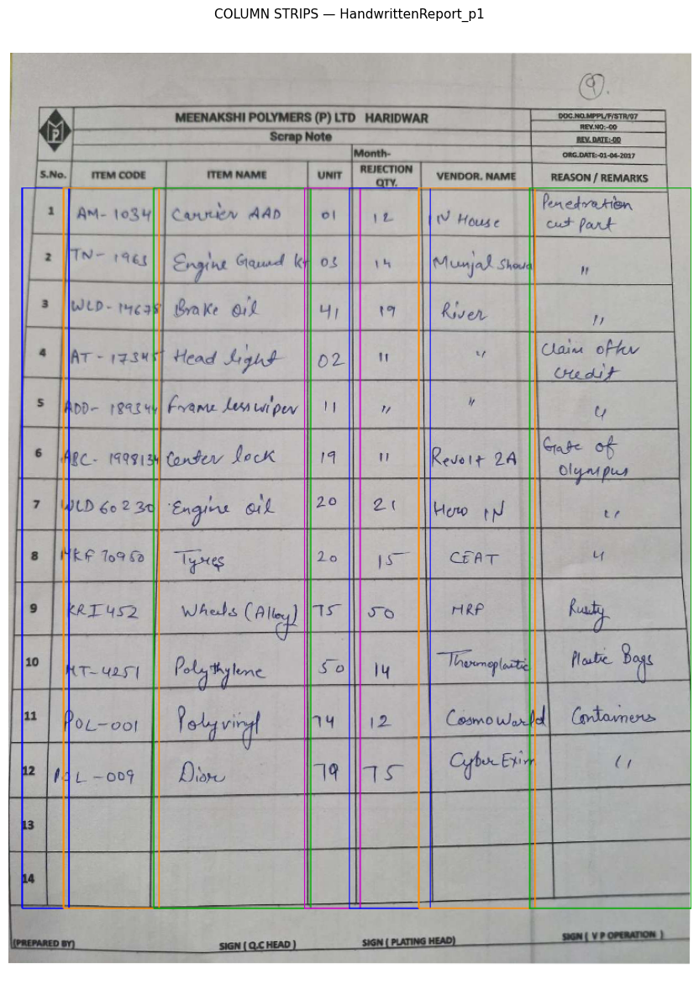

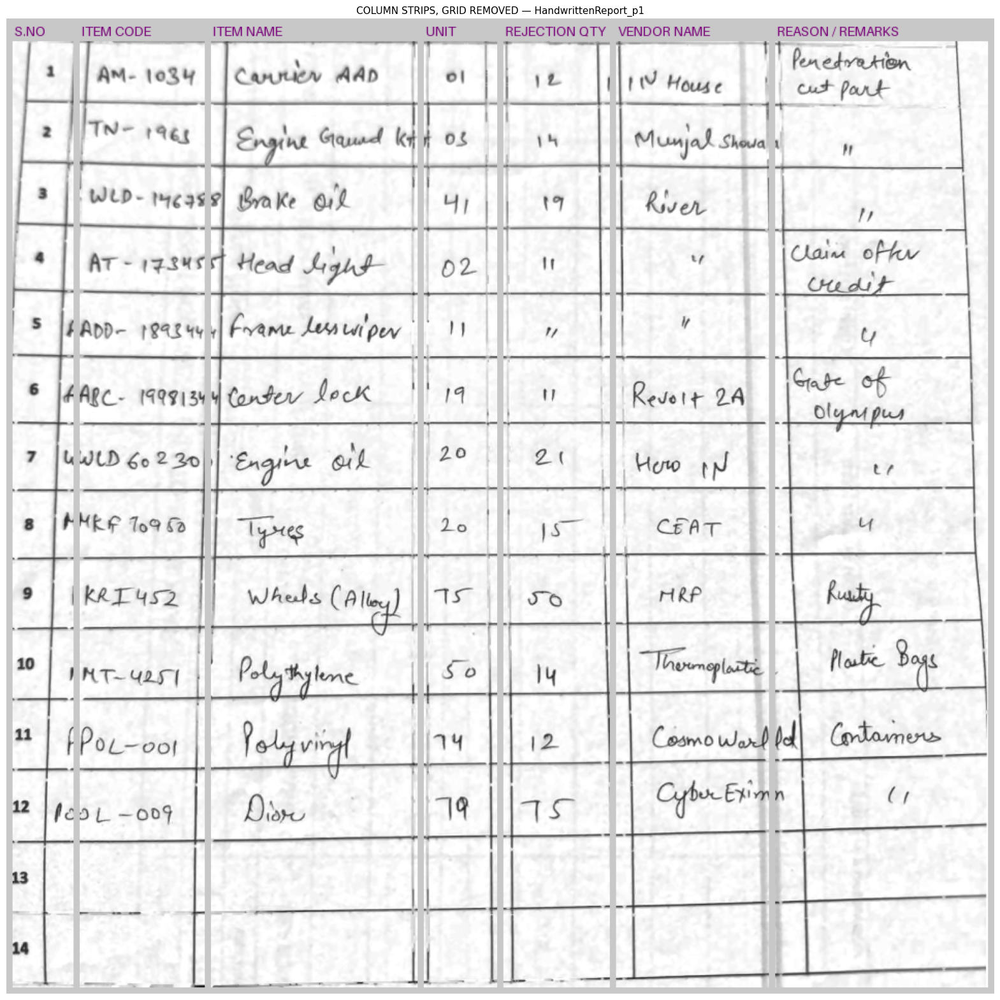

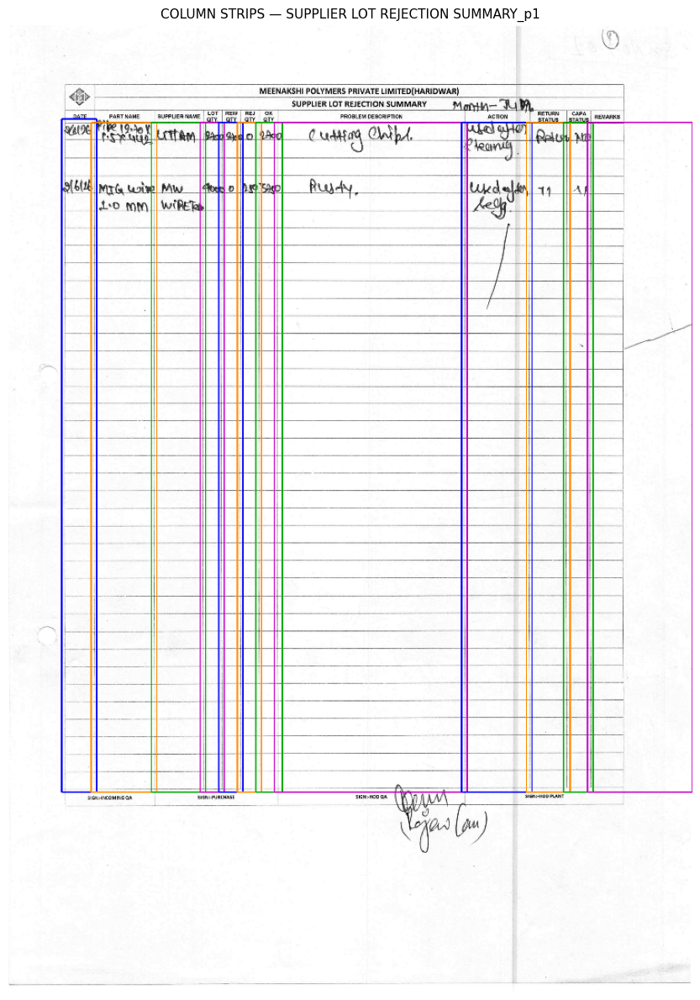

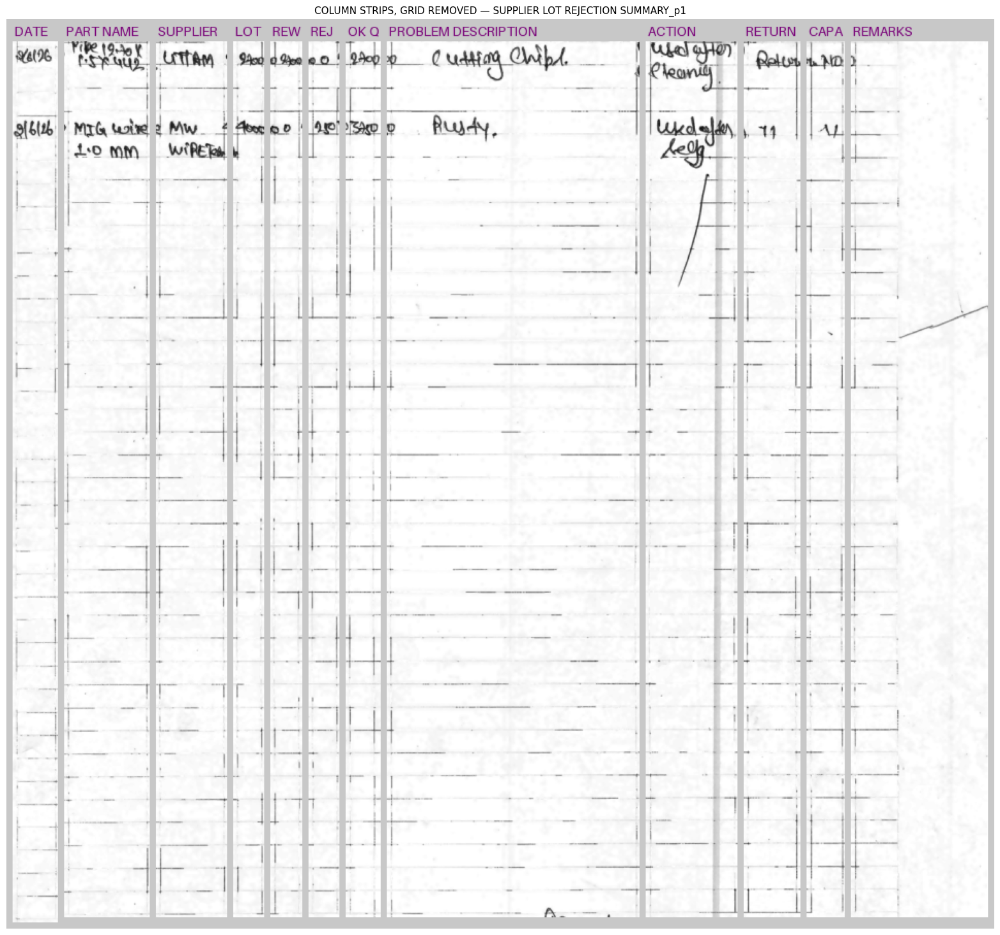

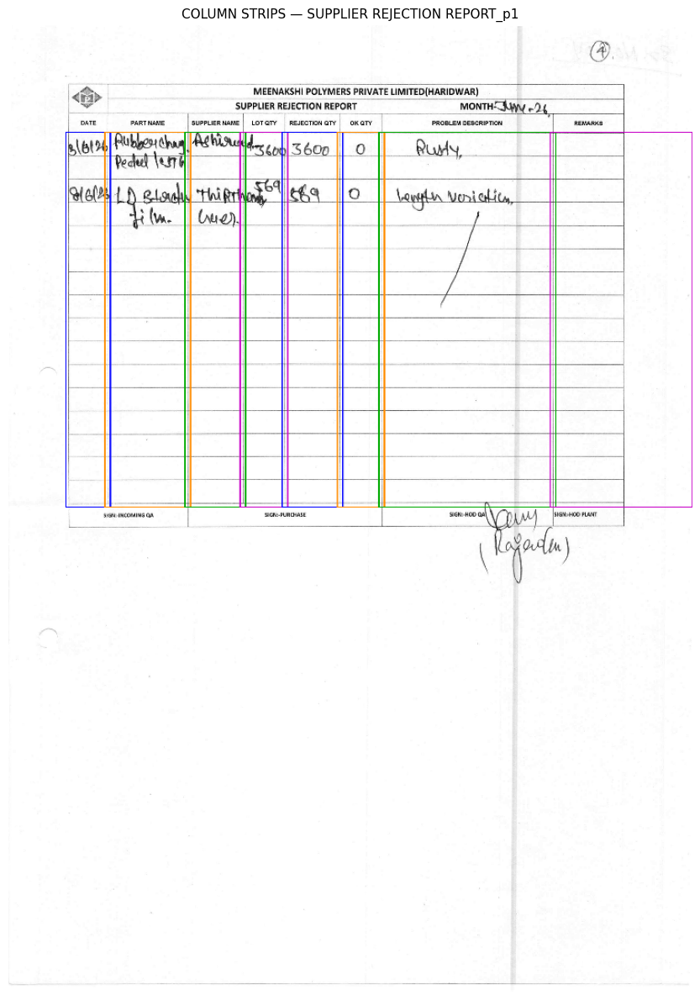

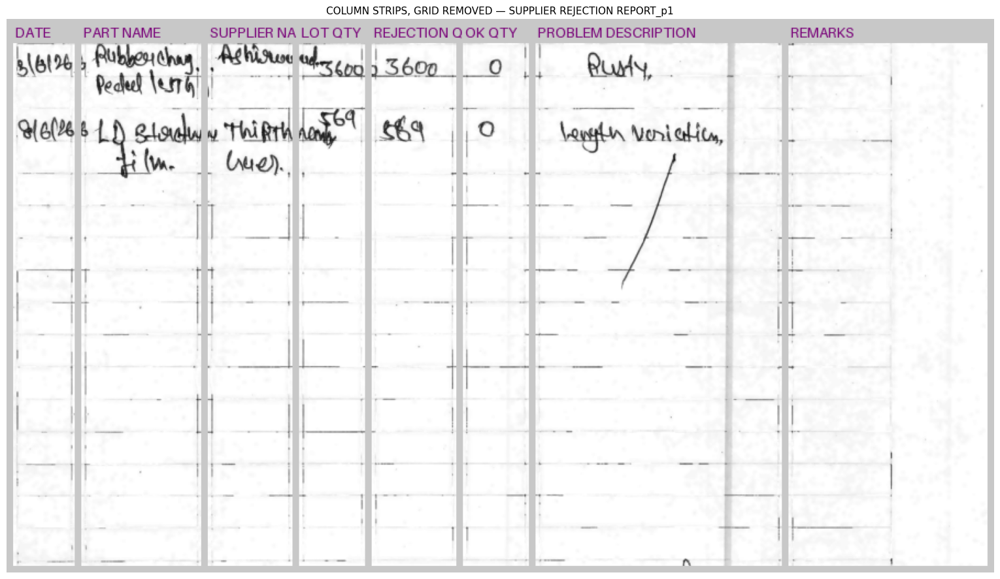

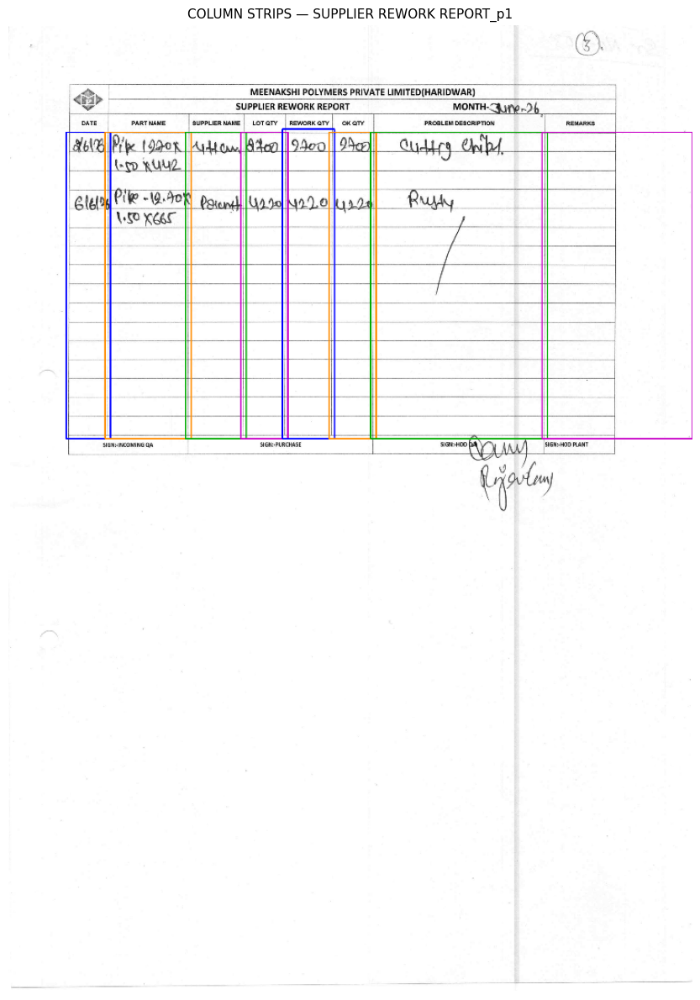

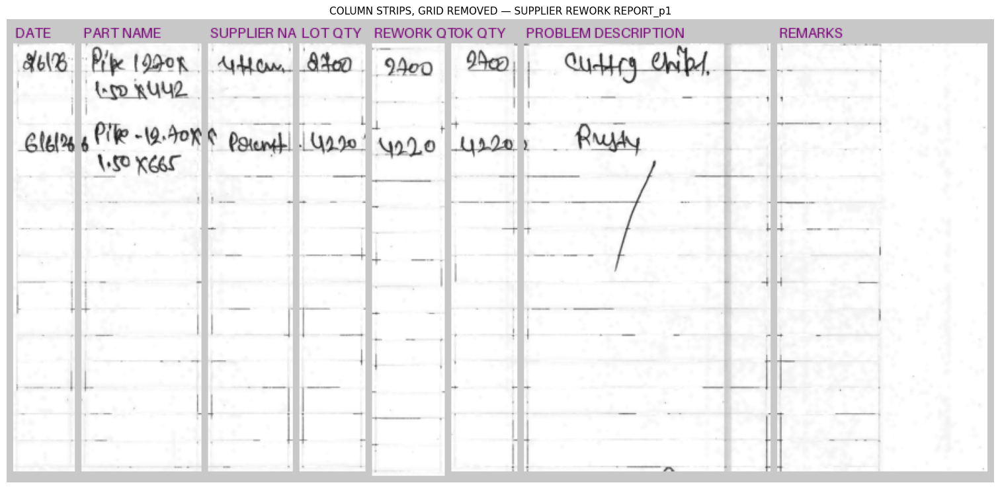

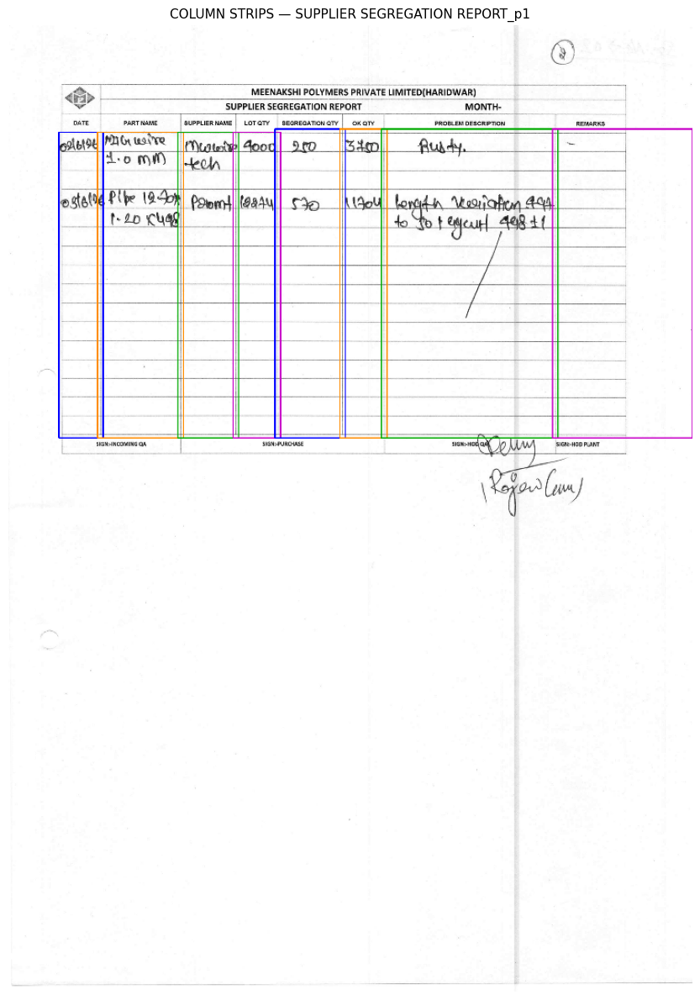

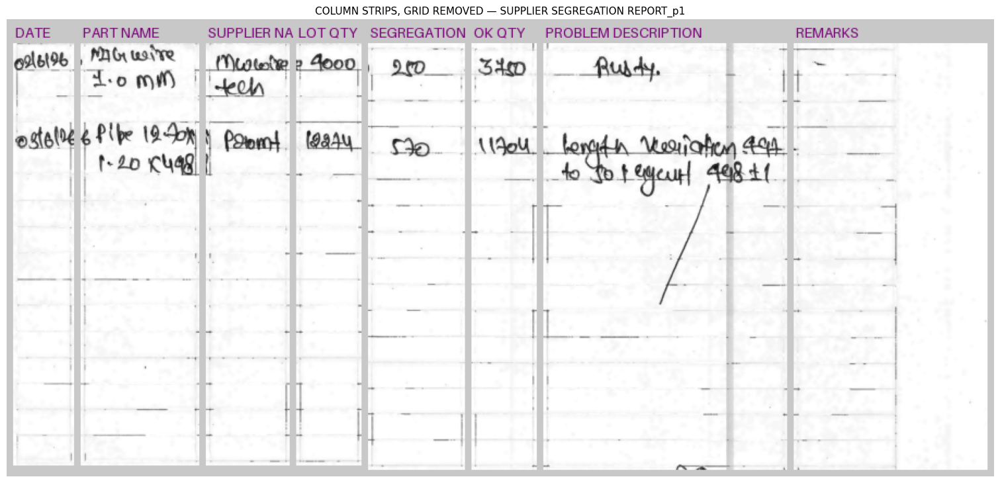

In [14]:
# ============================================================================
# STAGE 12 — DEBUG VIEWS + SAVING THE COLUMN STRIPS
# Writes OUTPUT_DIR/columns/<page>/<COLUMN NAME>.png and _clean.png, and shows the strips side by side.
# ============================================================================
def save_column_crops(page):
    if not SAVE_DEBUG:
        return
    base = os.path.join(OUTPUT_DIR, "columns", page.uid)
    os.makedirs(base, exist_ok=True)
    for name, col in page.columns.items():
        cv2.imwrite(os.path.join(base, safe_name(name) + ".png"), col["crop"])
        cv2.imwrite(os.path.join(base, safe_name(name) + "_clean.png"), col["clean"])


def column_sheet(page, kind="clean", scale=0.35, gap=6):
    """All the column strips laid out left to right, each under its header name."""
    names = list(page.columns)
    tiles = [cv2.resize(page.columns[n][kind], None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
             for n in names]
    head = 22
    height = head + max(t.shape[0] for t in tiles) + gap
    width = sum(t.shape[1] + gap for t in tiles) + gap
    canvas = np.full((height, width, 3), 200, np.uint8)
    xs, x = [], gap
    for t in tiles:
        canvas[head: head + t.shape[0], x: x + t.shape[1]] = to_bgr(t)
        xs.append(x)
        x += t.shape[1] + gap
    pil = Image.fromarray(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    d = ImageDraw.Draw(pil)
    try:
        font = ImageFont.load_default(size=13)
    except TypeError:
        font = ImageFont.load_default()
    for x0, n, t in zip(xs, names, tiles):
        d.text((x0 + 2, 4), n[:max(3, t.shape[1] // 7)], fill=(120, 0, 120), font=font)
    return cv2.cvtColor(np.array(pil), cv2.COLOR_RGB2BGR)


for pg in PAGES:
    if not pg.grid:
        continue
    save_column_crops(pg)
    boxes = draw_column_boxes(pg)
    raw_sheet, clean_sheet = column_sheet(pg, "crop"), column_sheet(pg, "clean")
    save_debug(pg, "08_column_boxes.png", boxes)
    save_debug(pg, "09_columns_raw.png", raw_sheet)
    save_debug(pg, "10_columns_clean.png", clean_sheet)
    if viewed(pg):
        show(cv2.resize(boxes, None, fx=0.3, fy=0.3), f"COLUMN STRIPS — {pg.uid}", figsize=(9, 12))
        show_h = max(3.0, 16 * clean_sheet.shape[0] / clean_sheet.shape[1])
        show(clean_sheet, f"COLUMN STRIPS, GRID REMOVED — {pg.uid}", figsize=(16, show_h))


In [15]:
# ============================================================================
# STAGE 13 — LOAD THE OCR MODELS  (GOT-OCR-2.0 and TrOCR, both pretrained, no fine-tuning)
# Every column strip is read by BOTH models so their outputs can be compared. ensure_got()/got_generate() come
# from Stage 7b (the form-identification step may already have loaded GOT there); ensure_trocr()/trocr_generate()
# are the equivalent pair for TrOCR, defined and loaded here for the first time.
# ============================================================================
COLUMN_SPLIT     = "rows"       # "rows"  : cut the strip at the printed row lines and read every entry (default;
                                #           keeps the columns aligned so Stage 16 can rebuild the table)
                                # "whole" : send the whole strip in one call - fewer calls, but a multi-line image
                                #           comes back as a single line for both models, so most of the column is lost
OCR_CROP_KIND    = "clean"      # "clean" = grid removed (Stage 11) | "crop" = raw padded strip (Stage 10)
OCR_SKIP_EMPTY   = True         # do not send row bands that hold no ink
MIN_ENTRY_INK    = 120          # ink pixels below which a row band counts as empty

OCR_JSON_PATH_GOT   = os.path.join(OUTPUT_DIR, "columns_ocr_results_GOT.json")
OCR_JSON_PATH_TROCR = os.path.join(OUTPUT_DIR, "columns_ocr_results_TrOcr.json")

GOT_MAX_NEW_TOKENS  = 128       # ceiling; the budget per image is scaled to its size (token_budget)
GOT_MIN_NEW_TOKENS  = 12
GOT_NO_REPEAT_NGRAM = 6         # a verbatim 6-token repeat is always a degenerate loop, never handwriting
GOT_WHOLE_TOKENS    = 512       # budget for "whole" mode, where one image holds the entire column

TROCR_MAX_NEW_TOKENS = 64       # a printed-row entry is a word or a number, never a multi-line page
TROCR_MIN_NEW_TOKENS = 4
TROCR_WHOLE_TOKENS   = 256      # budget for "whole" mode with TrOCR

ensure_got()
print(f"GOT-OCR-2.0 ready on {device} ({GOT_MODEL_ID})")


def ensure_trocr():
    """Load TrOCR once, into module globals. Safe to call again - a no-op once trocr_model exists."""
    global trocr_processor, trocr_model, device
    if "trocr_model" in globals() and trocr_model is not None:
        return
    import torch as _torch
    from transformers import TrOCRProcessor, VisionEncoderDecoderModel
    globals()["torch"] = _torch
    if "device" not in globals() or device is None:
        device = "cuda" if _torch.cuda.is_available() else "cpu"
    if device == "cpu":
        print("WARNING: no GPU - TrOCR will be slow on CPU.")
    print("Loading TrOCR ...")
    trocr_processor = load_pretrained(TrOCRProcessor, TROCR_MODEL_ID, use_fast=False)  # transformers 5.x TokenizersBackend regression: fast-tokenizer conversion wrongly demands sentencepiece/tiktoken even for TrOCR
    trocr_model = VisionEncoderDecoderModel.from_pretrained(TROCR_MODEL_ID).to(device)
    trocr_model.eval()


def trocr_generate(img, max_new_tokens):
    """Run TrOCR on one grayscale image -> (text, mean per-token probability). The one place TrOCR generate() is called."""
    ensure_trocr()
    image = Image.fromarray(img).convert("RGB")
    pixel_values = trocr_processor(images=image, return_tensors="pt").pixel_values.to(trocr_model.device)
    with torch.inference_mode():
        out = trocr_model.generate(pixel_values, max_new_tokens=max_new_tokens,
                                   output_scores=True, return_dict_in_generate=True)
    text = trocr_processor.batch_decode(out.sequences, skip_special_tokens=True)[0].strip()
    special = set(trocr_processor.tokenizer.all_special_ids)
    new_ids = out.sequences[0][1:]                          # sequences[0] starts with the decoder start token
    probs = [torch.softmax(step[0], dim=-1)[t].item() for step, t in zip(out.scores, new_ids)
             if t.item() not in special]
    return text, (float(np.mean(probs)) if probs else None)


ensure_trocr()
print(f"TrOCR ready on {device} ({TROCR_MODEL_ID})")
print(f"split: {COLUMN_SPLIT!r} | strips: {OCR_CROP_KIND!r}")
print(f"output: {OCR_JSON_PATH_GOT}\n        {OCR_JSON_PATH_TROCR}")


GOT-OCR-2.0 ready on cuda (stepfun-ai/GOT-OCR-2.0-hf)
Loading TrOCR ...


preprocessor_config.json:   0%|          | 0.00/224 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-base-handwritten and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


generation_config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

TrOCR ready on cuda (microsoft/trocr-base-handwritten)
split: 'rows' | strips: 'clean'
output: /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/columns_ocr_results_GOT.json
        /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/columns_ocr_results_TrOcr.json


In [16]:
# ============================================================================
# STAGE 14 — COLUMN READER  (engine-agnostic: "got" or "trocr")
# A column strip is read one printed row at a time: the strip is cut at the row lines, each band is trimmed to its
# ink and sent to the chosen model, and the readings come back in top-to-bottom order. Bands with no ink are
# reported as empty WITHOUT being sent, which keeps every column the same length for both engines - that is what
# lets Stage 16 put the rows back together side by side, separately for each engine.
#
# The guards are the ones the cell-wise notebook needed, and apply to either engine:
#   * the generation budget is scaled to the image, so a narrow QTY band cannot ramble on for the full ceiling;
#   * a repetition loop is detected and suppressed. It cannot be caught by confidence: such a loop repeats tokens
#     the model is sure about, and one real GOT example scored 0.88.
# ============================================================================
def _num(x):
    """JSON-safe number: NaN / inf / None -> None."""
    return None if x is None or not math.isfinite(x) else round(float(x), 4)


def ink_mask(gray):
    _, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    return mask


def trim_to_ink(gray, margin_ratio=0.15, min_ink_pixels=10):
    """Trim to the bounding box of the ink, then add a white margin. None if (almost) no ink."""
    if gray.size == 0:
        return None
    mask = cv2.morphologyEx(ink_mask(gray), cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))
    if np.count_nonzero(mask) < min_ink_pixels:
        return None
    ys, xs = np.nonzero(mask)
    trimmed = gray[ys.min(): ys.max() + 1, xs.min(): xs.max() + 1]
    m = int(min(trimmed.shape) * margin_ratio) + 4
    return cv2.copyMakeBorder(trimmed, m, m, m, m, cv2.BORDER_CONSTANT, value=255)


def token_budget(img, engine="got"):
    """About one token per 6 px of width, per line of text, clamped to the engine's own ceiling - room to ramble
    is what starts a loop, and TrOCR entries are short enough that they need a much lower ceiling than GOT's."""
    h, w = img.shape[:2]
    lines = max(1, int(round(h / 70.0)))
    lo, hi = (GOT_MIN_NEW_TOKENS, GOT_MAX_NEW_TOKENS) if engine == "got" else (TROCR_MIN_NEW_TOKENS, TROCR_MAX_NEW_TOKENS)
    return int(np.clip(w // 6 * lines, lo, hi))


def is_degenerate(text):
    """The repetition loop a model falls into on an unreadable image. Confidence cannot catch it - it scores HIGH."""
    toks = text.split()
    if len(toks) >= 8 and len(set(toks[-8:])) <= 2:
        return True
    squashed = re.sub(r"\s+", "", text)
    if len(squashed) >= 12:
        if max(squashed.count(ch) for ch in set(squashed)) / len(squashed) > 0.6:
            return True
    return False


def read_image(img, engine="got", budget=None):
    """One image -> dict(text, confidence [, error, raw]), read by the chosen engine ('got' | 'trocr')."""
    if engine == "got":
        text, conf = got_generate(img, budget or token_budget(img, engine), GOT_NO_REPEAT_NGRAM)
    else:
        text, conf = trocr_generate(img, budget or token_budget(img, engine))
    if is_degenerate(text):
        return dict(text="", confidence=None, error="degenerate repetition suppressed", raw=text[:80])
    return dict(text=text, confidence=_num(conf))


def row_bands(page, col):
    """(row number, band image, ink pixels) for every printed row inside this column strip."""
    l, t, r, b = col["crop_box"]
    strip = col[OCR_CROP_KIND]
    ys = [float(y) for y in page.grid["row_y"]]
    out = []
    for i, (y0, y1) in enumerate(zip(ys, ys[1:]), start=1):
        a, z = int(round(y0)) - t, int(round(y1)) - t
        a, z = max(a, 0), min(z, strip.shape[0])
        if z - a < 12:
            continue
        band = strip[a:z]
        core = band[V_PADDING // 2: max(band.shape[0] - V_PADDING // 2, 1)]     # ignore the rules at the edges
        out.append((i, band, int((core < INK_GRAY_THRESH).sum())))
    return out


def read_column(page, name, engine="got"):
    """Read one column strip with the chosen engine -> dict(entries=[...], text=...).
    One entry per printed row in "rows" mode."""
    col = page.columns[name]
    if COLUMN_SPLIT == "whole":
        trimmed = trim_to_ink(col[OCR_CROP_KIND])
        if trimmed is None:
            return dict(entries=[], text="")
        whole_tokens = GOT_WHOLE_TOKENS if engine == "got" else TROCR_WHOLE_TOKENS
        read = read_image(trimmed, engine, whole_tokens)
        return dict(entries=[dict(row=None, **read)], text=read["text"])

    entries = []
    for row_no, band, ink in row_bands(page, col):
        empty = ink < MIN_ENTRY_INK
        if empty and OCR_SKIP_EMPTY:
            entries.append(dict(row=row_no, text="", confidence=None, ink_pixels=ink, empty=True))
            continue
        trimmed = trim_to_ink(band)
        if trimmed is None:
            entries.append(dict(row=row_no, text="", confidence=None, ink_pixels=ink, empty=True))
            continue
        read = read_image(trimmed, engine)
        entries.append(dict(row=row_no, ink_pixels=ink, empty=False, **read))
    return dict(entries=entries, text=" | ".join(e["text"] for e in entries if e["text"]))


In [17]:
# ============================================================================
# STAGE 15 — READ EVERY COLUMN WITH BOTH ENGINES  ->  columns_ocr_results_GOT.json / _TrOcr.json
# Each engine reads the identical column crops (Stage 10-12), so any difference in the output is the model, not
# the image. The readings are filed under the column's header name, same shape for both engines:
#
#   meta   : engine, model, split mode, strip kind, seconds taken, timestamp
#   pages  : { "<page uid>": { pdf, page, template, rows,
#              columns: { "<COLUMN NAME>": { crop_file, crop_box,
#                                            text    : the whole column as one string, entries joined by " | ",
#                                            entries : [ {row, text, confidence, ink_pixels, empty [, error]} ] } } } }
# ============================================================================
def run_columns(pages, engine="got"):
    out = {}
    for pg in pages:
        if not pg.grid or not getattr(pg, "columns", None):
            continue
        page_out = dict(pdf=pg.pdf, page=pg.page_no, template=pg.template_key,
                        rows=max(len(pg.grid["row_y"]) - 1, 0), columns={})
        for name in pg.grid["col_names"]:
            col = pg.columns[name]
            suffix = "_clean" if OCR_CROP_KIND == "clean" else ""
            try:
                read = read_column(pg, name, engine)
            except Exception as e:                      # one bad column must not stop the page
                read = dict(entries=[], text="", error=f"{type(e).__name__}: {e}")
            page_out["columns"][name] = dict(
                crop_file=f"columns/{pg.uid}/{safe_name(name)}{suffix}.png",
                crop_box=col["crop_box"], **read)
            filled = sum(1 for e in read["entries"] if e.get("text"))
            print(f"[{engine.upper():5s}] {pg.uid}: {name:24s} {len(read['entries']):3d} rows, {filled:3d} with text")
        out[pg.uid] = page_out
    return out


def flatten_results(results):
    return pd.DataFrame([dict(page=uid, column=name, row=e["row"], text=e["text"], confidence=e["confidence"])
                         for uid, p in results.items() for name, c in p["columns"].items() for e in c["entries"]])


OCR_RUNTIME     = {}    # engine -> seconds taken (Stage 16b's speed comparison)
COLUMN_RESULTS  = {}    # engine -> {page uid: page dict}   (same shape written to the JSON files)
OCR_DF          = {}    # engine -> flat DataFrame of every (page, column, row) entry

for engine, json_path in (("got", OCR_JSON_PATH_GOT), ("trocr", OCR_JSON_PATH_TROCR)):
    t0 = time.time()
    results = run_columns(PAGES, engine)
    elapsed = time.time() - t0
    OCR_RUNTIME[engine] = elapsed
    COLUMN_RESULTS[engine] = results

    model_id = GOT_MODEL_ID if engine == "got" else TROCR_MODEL_ID
    payload = dict(meta=dict(engine=engine, model=model_id, split=COLUMN_SPLIT, crop_kind=OCR_CROP_KIND,
                             skip_empty=OCR_SKIP_EMPTY, seconds=round(elapsed, 1),
                             created=datetime.now().isoformat(timespec="seconds")),
                   pages=results)
    with open(json_path, "w", encoding="utf-8") as f:
        json.dump(payload, f, ensure_ascii=False, indent=2)

    df = flatten_results(results)
    OCR_DF[engine] = df
    entries_csv = os.path.join(OUTPUT_DIR, f"columns_ocr_entries_{'GOT' if engine == 'got' else 'TrOcr'}.csv")
    df.to_csv(entries_csv, index=False, encoding="utf-8-sig")

    has_text = df["text"].astype(str).str.strip() != "" if len(df) else pd.Series(dtype=bool)
    mean_conf = df.loc[has_text, "confidence"].mean() if has_text.any() else float("nan")
    print(f"\n[{engine.upper()}] saved {json_path}  ({elapsed:.0f}s)")
    print(f"[{engine.upper()}] saved {entries_csv}")
    print(f"[{engine.upper()}] {len(df)} entries | {int(has_text.sum())} with text | mean confidence {mean_conf:.3f}\n")

OCR_DF["got"].head(30)


[GOT  ] HandwrittenReport_p1: S.NO                      14 rows,  14 with text
[GOT  ] HandwrittenReport_p1: ITEM CODE                 14 rows,  14 with text
[GOT  ] HandwrittenReport_p1: ITEM NAME                 14 rows,  14 with text
[GOT  ] HandwrittenReport_p1: UNIT                      14 rows,  14 with text
[GOT  ] HandwrittenReport_p1: REJECTION QTY             14 rows,  14 with text
[GOT  ] HandwrittenReport_p1: VENDOR NAME               14 rows,  14 with text
[GOT  ] HandwrittenReport_p1: REASON / REMARKS          14 rows,  14 with text
[GOT  ] SUPPLIER LOT REJECTION SUMMARY_p1: DATE                      38 rows,   4 with text
[GOT  ] SUPPLIER LOT REJECTION SUMMARY_p1: PART NAME                 38 rows,   4 with text
[GOT  ] SUPPLIER LOT REJECTION SUMMARY_p1: SUPPLIER NAME             38 rows,   7 with text
[GOT  ] SUPPLIER LOT REJECTION SUMMARY_p1: LOT QTY                   38 rows,   6 with text
[GOT  ] SUPPLIER LOT REJECTION SUMMARY_p1: REW QTY                   38 rows,  

,page,column,row,text,confidence
0,HandwrittenReport_p1,S.NO,1,1,0.8476
1,HandwrittenReport_p1,S.NO,2,I-1,0.6081
2,HandwrittenReport_p1,S.NO,3,31,0.4764
3,HandwrittenReport_p1,S.NO,4,+,0.3971
4,HandwrittenReport_p1,S.NO,5,S,0.3630
5,HandwrittenReport_p1,S.NO,6,6 4,0.7195
6,HandwrittenReport_p1,S.NO,7,7 4,0.8588
7,HandwrittenReport_p1,S.NO,8,8 1,0.4735
8,HandwrittenReport_p1,S.NO,9,9 ！,0.7051
9,HandwrittenReport_p1,S.NO,10,10,0.6534


In [18]:
# ============================================================================
# STAGE 16 — PUT THE COLUMNS BACK SIDE BY SIDE, PER ENGINE  ->  structured_GOT/ + structured_TrOcr/
# Every column returned one entry per printed row, so row i of each column belongs to the same line of the form and
# the table can simply be zipped back together. One CSV per source PDF, per engine. Rows that came out empty in
# every column are dropped, since a blank printed row is not a record.
# (In "whole" mode there is a single entry per column and nothing to align, so no CSV is written.)
# ============================================================================
STRUCTURED_DIR_GOT   = os.path.join(OUTPUT_DIR, "structured_GOT")
STRUCTURED_DIR_TROCR = os.path.join(OUTPUT_DIR, "structured_TrOcr")
INCLUDE_CONF   = True


def clean_text(t):
    return re.sub(r"\s+", " ", str(t or "")).strip().strip("`").strip()


def columns_to_table(payload=None, json_path=None):
    """{pdf stem: DataFrame} - the column entries zipped back into rows, for whichever engine's JSON is passed in."""
    if payload is None:
        with open(json_path or OCR_JSON_PATH_GOT, encoding="utf-8") as f:
            payload = json.load(f)
    tables = {}
    for uid, page in payload["pages"].items():
        if any(e.get("row") is None for c in page["columns"].values() for e in c["entries"]):
            continue                                            # "whole" mode: nothing to align
        stem = os.path.splitext(page["pdf"])[0]
        names = list(page["columns"])
        rows = sorted({e["row"] for c in page["columns"].values() for e in c["entries"]})
        entry = tables.setdefault(stem, dict(columns=[], rows=[]))
        for n in names:
            if n not in entry["columns"]:
                entry["columns"].append(n)
        for r in rows:
            row = dict(source_pdf=page["pdf"], template=page["template"], page=page["page"], printed_row=r)
            texts = []
            for n in names:
                cell = next((e for e in page["columns"][n]["entries"] if e["row"] == r), None)
                text = clean_text(cell.get("text") if cell else "")
                row[n] = text
                texts.append(text)
                if INCLUDE_CONF:
                    row[f"{n} (conf)"] = (cell or {}).get("confidence")
            if any(texts):                                      # drop printed rows nobody wrote on
                entry["rows"].append(row)

    meta = ["source_pdf", "template", "page", "printed_row"]
    out = {}
    for stem, e in sorted(tables.items()):
        order = meta + e["columns"] + ([f"{n} (conf)" for n in e["columns"]] if INCLUDE_CONF else [])
        df = pd.DataFrame(e["rows"]).reindex(columns=order)
        out[stem] = df.sort_values(["page", "printed_row"]).reset_index(drop=True)
    return out


TABLES = {}    # engine -> {pdf stem: DataFrame}
for engine, json_path, out_dir in (("got", OCR_JSON_PATH_GOT, STRUCTURED_DIR_GOT),
                                    ("trocr", OCR_JSON_PATH_TROCR, STRUCTURED_DIR_TROCR)):
    os.makedirs(out_dir, exist_ok=True)
    tables = columns_to_table(json_path=json_path)
    TABLES[engine] = tables
    for stem, df in tables.items():
        path = os.path.join(out_dir, f"{safe_name(stem)}.csv")
        df.to_csv(path, index=False, encoding="utf-8-sig")
        n_cols = len([c for c in df.columns if not c.endswith("(conf)")]) - 4
        print(f"[{engine.upper()}] {path}\n    {len(df)} rows x {n_cols} columns")

if not TABLES["got"] and not TABLES["trocr"]:
    print("no table written (COLUMN_SPLIT == 'whole' produces one entry per column, which cannot be aligned)")
if TABLES["got"]:
    first = next(iter(TABLES["got"]))
    print(f"\npreview (GOT) - {first}")
    display(TABLES["got"][first][[c for c in TABLES["got"][first].columns if not c.endswith("(conf)")]].head(20))


[GOT] /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/structured_GOT/HandwrittenReport.csv
    14 rows x 7 columns
[GOT] /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/structured_GOT/SUPPLIER_LOT_REJECTION_SUMMARY.csv
    23 rows x 12 columns
[GOT] /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/structured_GOT/SUPPLIER_REJECTION_REPORT.csv
    12 rows x 8 columns
[GOT] /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/structured_GOT/SUPPLIER_REWORK_REPORT.csv
    12 rows x 8 columns
[GOT] /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/structured_GOT/SUPPLIER_SEGREGATION_REPORT.csv
    9 rows x 8 columns
[TROCR] /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/structured_TrOcr/HandwrittenReport.csv
    14 rows x 7 columns
[TROCR] /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/structured_TrOcr/SUPPLIER_LOT_REJECTION_SUMMARY.csv
    23 rows x 12 columns
[TROCR] /content/drive/MyDrive/MeenakshiPublic/ocr_ou

,source_pdf,template,page,printed_row,S.NO,ITEM CODE,ITEM NAME,UNIT,REJECTION QTY,VENDOR NAME,REASON / REMARKS
0,HandwrittenReport.pdf,weld_shop_rejection_report,1,1,1,AM- 1034,AAD,01,12,Hou e,Penedreton
1,HandwrittenReport.pdf,weld_shop_rejection_report,1,2,I-1,TN- 1965,Engine Gaur d kt,OS,144,MunjalShoua,111111
2,HandwrittenReport.pdf,weld_shop_rejection_report,1,3,31,WED- 14678,Brake,411,191,River,111111
3,HandwrittenReport.pdf,weld_shop_rejection_report,1,4,+,AT-17345,Head,021,111,111111,C la in
4,HandwrittenReport.pdf,weld_shop_rejection_report,1,5,S,ADD-189344,frame,111,1234,LIC M,4 2
5,HandwrittenReport.pdf,weld_shop_rejection_report,1,6,6 4,ARC-1998134,4 Center Jock,191,1234,RevoIt2A,olympus
6,HandwrittenReport.pdf,weld_shop_rejection_report,1,7,7 4,WLD60230,Engine oil,20=,211,Hero,111111
7,HandwrittenReport.pdf,weld_shop_rejection_report,1,8,8 1,Mk f 70950,Tyves,2 o,J IS,CEAT,111
8,HandwrittenReport.pdf,weld_shop_rejection_report,1,9,9 ！,KRI452,WHeLs( Alloy),751,500,HRP,Rusty
9,HandwrittenReport.pdf,weld_shop_rejection_report,1,10,10,MT-4251,Polythylene,S,142,The rmo plout e,Pla tic Bags


Report written to /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column/model_comparison_report
     engine  entries  filled  fill_rate  mean_confidence  median_confidence  seconds  entries_per_second
GOT-OCR-2.0      938     258     0.2751           0.6255             0.6510    436.0                2.15
      TrOCR      938     264     0.2814           0.4289             0.4255     25.6               36.71


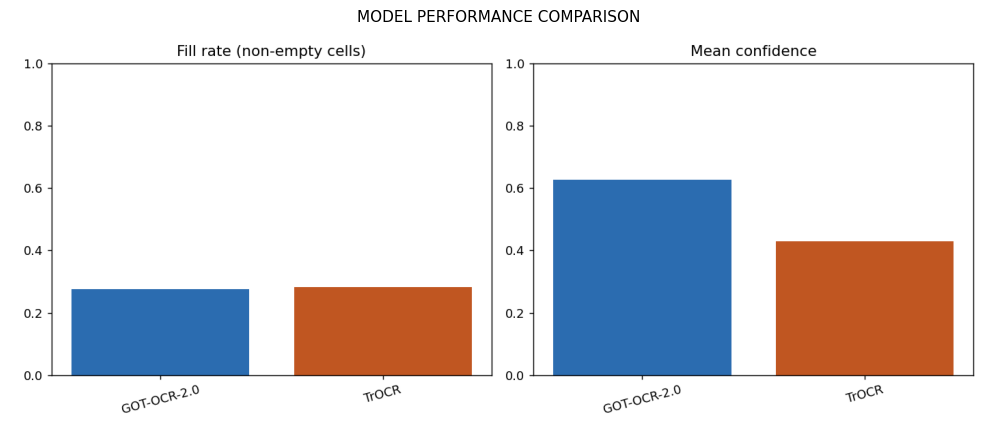

In [19]:
# ============================================================================
# STAGE 16b — MODEL PERFORMANCE + COMPARISON REPORT  ->  OUTPUT_DIR/model_comparison_report/
# Both engines read the exact same column crops (Stage 10-12), so any difference between them is the model, not
# the image. This stage scores each engine on its own (fill rate, confidence, speed) and against the other
# (how often GOT-OCR-2.0 and TrOCR agree on the same handwritten cell), and writes it all to one report folder:
#
#   performance_summary.csv      - one row per engine: entries, fill rate, mean/median confidence, speed
#   per_column_comparison.csv    - one row per column: agreement %, mean similarity, mean confidence per engine
#   cell_by_cell_comparison.csv  - one row per (page, column, row): both engines' text/confidence + similarity
#   performance_comparison.png   - fill-rate / confidence bar charts
#   report.md                    - the narrative version of the three CSVs above
# ============================================================================
import difflib

REPORT_DIR = os.path.join(OUTPUT_DIR, "model_comparison_report")
os.makedirs(REPORT_DIR, exist_ok=True)

ENGINE_LABEL = {"got": "GOT-OCR-2.0", "trocr": "TrOCR"}


def engine_stats(df, engine):
    n = len(df)
    filled = df["text"].astype(str).str.strip() != "" if n else pd.Series(dtype=bool)
    conf = df.loc[filled, "confidence"].dropna() if n else pd.Series(dtype=float)
    seconds = OCR_RUNTIME.get(engine, 0.0)
    return dict(engine=ENGINE_LABEL[engine], entries=n, filled=int(filled.sum()),
               fill_rate=round(float(filled.mean()), 4) if n else None,
               mean_confidence=round(float(conf.mean()), 4) if len(conf) else None,
               median_confidence=round(float(conf.median()), 4) if len(conf) else None,
               seconds=round(seconds, 1),
               entries_per_second=round(n / seconds, 2) if seconds else None)


overall = pd.DataFrame([engine_stats(OCR_DF["got"], "got"), engine_stats(OCR_DF["trocr"], "trocr")])
overall.to_csv(os.path.join(REPORT_DIR, "performance_summary.csv"), index=False)


# ---- cell-by-cell comparison: same page/column/row, read by both engines -------------------------------------
def similarity(a, b):
    a, b = str(a or "").strip(), str(b or "").strip()
    if not a and not b:
        return None
    return round(difflib.SequenceMatcher(None, a.lower(), b.lower()).ratio(), 4)


def exact_match(a, b):
    a, b = str(a or "").strip(), str(b or "").strip()
    if not a and not b:
        return None
    return a.lower() == b.lower()


merged = pd.merge(OCR_DF["got"], OCR_DF["trocr"], on=["page", "column", "row"],
                  suffixes=("_got", "_trocr"), how="outer")
merged["similarity"] = [similarity(a, b) for a, b in zip(merged["text_got"], merged["text_trocr"])]
merged["exact_match"] = [exact_match(a, b) for a, b in zip(merged["text_got"], merged["text_trocr"])]
merged = merged.sort_values(["page", "column", "row"]).reset_index(drop=True)
merged.to_csv(os.path.join(REPORT_DIR, "cell_by_cell_comparison.csv"), index=False, encoding="utf-8-sig")

both_written = merged.dropna(subset=["exact_match"]).copy()

per_col = (both_written.groupby("column")
          .agg(cells=("exact_match", "size"),
               exact_match_pct=("exact_match", lambda s: round(100 * s.mean(), 1)),
               mean_similarity=("similarity", lambda s: round(s.mean(), 3)),
               got_mean_conf=("confidence_got", lambda s: round(s.mean(), 3) if s.notna().any() else None),
               trocr_mean_conf=("confidence_trocr", lambda s: round(s.mean(), 3) if s.notna().any() else None))
          .reset_index().sort_values("column"))
per_col.to_csv(os.path.join(REPORT_DIR, "per_column_comparison.csv"), index=False)


# ---- charts -----------------------------------------------------------------------------------------------
fig, ax = plt.subplots(1, 2, figsize=(11, 4.5))
colors = ["#2b6cb0", "#c05621"]
ax[0].bar(overall["engine"], overall["fill_rate"].fillna(0), color=colors)
ax[0].set_title("Fill rate (non-empty cells)"); ax[0].set_ylim(0, 1)
ax[1].bar(overall["engine"], overall["mean_confidence"].fillna(0), color=colors)
ax[1].set_title("Mean confidence"); ax[1].set_ylim(0, 1)
for a in ax:
    a.tick_params(axis="x", rotation=15)
plt.tight_layout()
chart_path = os.path.join(REPORT_DIR, "performance_comparison.png")
plt.savefig(chart_path, dpi=130)
plt.close(fig)


# ---- written report -----------------------------------------------------------------------------------------
overall_exact = round(100 * both_written["exact_match"].mean(), 1) if len(both_written) else None
overall_sim = round(float(both_written["similarity"].mean()), 3) if len(both_written) else None

def to_md_table(df):
    try:
        return df.to_markdown(index=False)
    except ImportError:                                 # tabulate missing - fall back to a plain table
        return df.to_string(index=False)

lines = []
lines.append("# OCR Model Comparison Report")
lines.append("")
lines.append(f"Generated {datetime.now().isoformat(timespec='seconds')}  |  pages processed: {len(PAGES)}")
lines.append("")
lines.append("## Models")
lines.append(f"- **GOT-OCR-2.0** - `{GOT_MODEL_ID}`")
lines.append(f"- **TrOCR** - `{TROCR_MODEL_ID}`")
lines.append("")
lines.append("Both models read the identical column crops produced by Stages 10-12, so their results are directly comparable.")
lines.append("")
lines.append("## Overall performance")
lines.append("")
lines.append(to_md_table(overall))
lines.append("")
lines.append("## Agreement between the two models")
lines.append("")
lines.append(f"- Cells either model wrote something into (both blank cells excluded): **{len(both_written)}**")
lines.append(f"- Exact text match: **{overall_exact}%**")
lines.append(f"- Mean character-level similarity (difflib ratio, 0-1): **{overall_sim}**")
lines.append("")
lines.append("## Per-column breakdown")
lines.append("")
lines.append(to_md_table(per_col))
lines.append("")
lines.append("## Files in this folder")
lines.append("")
lines.append("- `performance_summary.csv` - per-model totals (fill rate, confidence, speed)")
lines.append("- `per_column_comparison.csv` - agreement + confidence, one row per column")
lines.append("- `cell_by_cell_comparison.csv` - every (page, column, row): both models' text, confidence, similarity")
lines.append("- `performance_comparison.png` - fill-rate / confidence bar charts")
lines.append("")
lines.append("## Reading it")
lines.append("")
lines.append("A column with a high exact-match % and similar confidence from both models is safe to trust either engine")
lines.append("on. A column where GOT and TrOCR disagree often, or where one engine's confidence is much lower, is worth a")
lines.append("manual spot check - `cell_by_cell_comparison.csv` has the specific rows that differ.")

report_path = os.path.join(REPORT_DIR, "report.md")
with open(report_path, "w", encoding="utf-8") as f:
    f.write("\n".join(lines) + "\n")

print(f"Report written to {REPORT_DIR}")
print(overall.to_string(index=False))
if SHOW_DEBUG:
    show(cv2.imread(chart_path), "MODEL PERFORMANCE COMPARISON", figsize=(11, 4.5))


In [20]:
# ============================================================================
# STAGE 17 — ZIP THE OUTPUT + DOWNLOAD IT
# The results are already permanent (OUTPUT_DIR is on Drive under Colab); the zip is a convenience copy, built on
# the fast local disk. It contains columns_ocr_results_GOT.json, columns_ocr_results_TrOcr.json,
# structured_GOT/, structured_TrOcr/, model_comparison_report/, columns/ and debug/.
# ============================================================================
ZIP_DIR = "/content" if IN_COLAB else os.path.dirname(os.path.abspath(OUTPUT_DIR))
zip_path = shutil.make_archive(os.path.join(ZIP_DIR, "column_output"), "zip", OUTPUT_DIR)
print(f"zipped {OUTPUT_DIR} -> {zip_path} ({os.path.getsize(zip_path) / 1e6:.1f} MB)")

if IN_COLAB:
    from google.colab import files
    files.download(zip_path)
    print("Results also kept permanently in:", OUTPUT_DIR)
else:
    print("Not running in Colab - zip is here:", os.path.abspath(zip_path))


zipped /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column -> /content/column_output.zip (75.7 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Results also kept permanently in: /content/drive/MyDrive/MeenakshiPublic/ocr_output_v4_column
